In [9]:
from neuron import h, gui
import LFPy
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.collections import PolyCollection
from matplotlib.patches import FancyArrowPatch
from matplotlib.colors import Normalize
from matplotlib.colors import LinearSegmentedColormap
from LFPy import InfiniteHomogeneousVolCondMEG
from lfpykit import LineSourcePotential
from scipy.signal import savgol_filter
from mpl_toolkits.axisartist.parasite_axes import HostAxes

# Set the dark theme
plt.style.use('default')
#plt.style.use('dark_background')

my_green = '#1b9e77'
my_orange = '#d95f02'
my_purple = '#7570b3'

my_green = '#1b9e77'
my_orange = '#d95f02'
my_purple = '#7570b3'

my_greens = ['#f7fcf5', '#e5f5e0', '#c7e9c0', '#a1d99b', '#74c476', '#41ab5d', '#238b45', '#006d2c', '#00441b']
my_oranges = ['#fff5eb', '#fee6ce', '#fdd0a2', '#fdae6b', '#fd8d3c', '#f16913', '#d94801', '#a63603', '#7f2704']
my_purples = ['#fcfbfd', '#efedf5', '#dadaeb', '#bcbddc', '#9e9ac8', '#807dba', '#6a51a3', '#54278f', '#3f007d']

my_green_cmap = LinearSegmentedColormap.from_list('SmoothMap', my_greens[2:-1], N=256)
my_orange_cmap = LinearSegmentedColormap.from_list('SmoothMap', my_oranges[2:-1], N=256)
my_purple_cmap = LinearSegmentedColormap.from_list('SmoothMap', my_purples[2:-1], N=256)

# Dark blue, strong orange, green, pink, soft orange, soft blue
ziad_colors = ['#0072B2', '#D55E00', '#009E73', '#CC79A7', '#E69F00', '#56B4E9']

ziad_blues = ['#004166', '#00517f', '#006299', '#0072b2', '#0082cc', '#0093e5', '#00a3ff']
ziad_oranges = ['#893c00', '#a24700', '#bc5300', '#d55e00', '#ef6900', '#ff7609', '#ff8423']
ziad_greens = ['#00523b', '#006b4e', '#008560', '#009e73', '#00b886', '#00d198', '#00ebab']

ziad_blue_cmap = LinearSegmentedColormap.from_list('SmoothMap', ziad_blues[::-1], N=256)
ziad_orange_cmap = LinearSegmentedColormap.from_list('SmoothMap', ziad_oranges[::-1], N=256)
ziad_green_cmap = LinearSegmentedColormap.from_list('SmoothMap', ziad_greens[::-1], N=256)

my_green = ziad_colors[2]
my_orange = ziad_colors[1]
my_purple = ziad_colors[0]
#my_green_cmap = ziad_green_cmap
#my_orange_cmap = ziad_orange_cmap
my_purple_cmap = ziad_blue_cmap

h.load_file('stdrun.hoc')
cvode = h.CVode()
try:
    cvode.use_fast_imem(1)
except AttributeError:
    raise Exception('neuron.h.CVode().use_fast_imem() method not '
                    'found. Update NEURON to v.7.4 or newer')

axon_diameter = 2  # Axon diameter in um
seg_len = axon_diameter/4
sigma_e = 0.3  # extracellular conductivity
sigma_i = 1/h.Section().Ra * 100 # multiplication by 100 is because the unit of Ra is S/cm

cellParameters = {
    'dt': 2**-6,
    'tstart': -10,
    'tstop': 50,
    'v_init': -65,
    'pt3d': True,
    'nsegs_method': None,
}

# Setup cell stimulation
synapseParameters = {
    'idx': 0,
    'e': 0,
    'syntype': 'ExpSyn', 
    'weight': 0.,
    'tau': 2,
    'record_current': True,
}

#Settings that only need to be run once per ipynb
# random.shuffle(cmap) #Use this if you want colors to be in a different order so the more similar ones are separated
plt.rcParams['lines.linewidth'] = 0.5
font = {'monospace' : 'Arial',
        'family': 'monospace',
        'weight' : 'normal',
        'size'   : 8}
plt.rc('font', **font)
plt.rcParams['xtick.major.pad']='.5'
plt.rcParams['ytick.major.pad']='.5'
plt.rcParams['axes.labelpad']='-2'
plt.rcParams['axes.linewidth'] = 0.5 # set the value globally

In [5]:
def stick(axon_length, plot=1):
    axon = h.Section(name='axon')
    axon.L = axon_length
    axon.diam = axon_diameter
    axon.nseg = (int(axon.L/seg_len) // 2) * 2 + 1
    axon.insert("hh")
    h.topology()

    firing_threshold = 0
    weight_increment = 0.01

    neuron_fired = False
    synapseParameters['weight'] = 0.

    while not neuron_fired:
        synapseParameters['weight'] += weight_increment
        print(f"Synaptic weight = {synapseParameters['weight']}")  
        
        # Create cell
        cell = LFPy.Cell(morphology=h.allsec(), **cellParameters)

        # Set the cell's position
        cell.set_pos(x=-axon_length/2 + seg_len/2, y=0, z=0)
    
        # Setup cell stimulation
        stim_idx = cell.get_closest_idx(x=0., y=0., z=0.)
        synapseParameters['idx'] = stim_idx
        synapse = LFPy.Synapse(cell, **synapseParameters)
        synapse.set_spike_times(np.array([5]))

        # Simulate cell
        cell.simulate(rec_imem=True, rec_vmem=True)

        if np.max(cell.vmem[stim_idx]) > firing_threshold:
            neuron_fired = True
            print(f"Neuron fired at synaptic weight = {synapseParameters['weight']}")

        if synapseParameters['weight'] > 0.1:
            print("Reached maximum weight limit without firing!")
            break

    iaxial, d, pos = cell.get_axial_currents_from_vmem()
    
    # Plot cell geometry
    zips = []
    for x, z in cell.get_idx_polygons():
        zips.append(list(zip(x, z)))
        
    polycol = PolyCollection(zips, edgecolors='none', facecolors='gray')

    if plot:
        fig, ax = plt.subplots(1)
        ax.add_collection(polycol)
        ax.axis(ax.axis('equal'))
        plt.show()

        plt.figure(figsize=(12, 6))
        plt.subplot(223)
        plt.plot(cell.tvec, synapse.i, 'r')
        plt.xlabel('Time (ms)')
        plt.title('Synaptic current (nA)')
        plt.subplot(224)
        plt.plot(cell.tvec, cell.vmem[stim_idx], 'k')
        plt.xlabel('Time (ms)')
        plt.title('Synaptic voltage (mV)')
        plt.subplot(211)
        plt.plot(cell.x.T, cell.z.T, 'k')
        plt.plot(synapse.x, synapse.z,
                color='r', marker='o', markersize=10)
        plt.axis([-axon_length/2, axon_length/2, -600, 600])
        plt.title('Morphology')
    
    synapse_idx = stim_idx
    x = cell.x[:, 0]
    vmem = cell.vmem
    imem = cell.imem

    iaxial, d, pos = cell.get_axial_currents_from_vmem()
    iaxial = iaxial[0::2, :]
    x_iaxial = pos[0::2, 0]

    return synapse_idx, x, vmem, imem, x_iaxial, iaxial

def ball_stick(axon_length, soma_diameter, plot=1):
    soma = h.Section(name='soma')
    soma.L = soma.diam = soma_diameter
    soma.insert("hh")
    
    axon = h.Section(name='axon')
    axon.L = axon_length
    axon.diam = axon_diameter
    axon.nseg = (int(axon.L/seg_len) // 2) * 2 + 1
    axon.insert("hh")
    
    axon.connect(soma, 1, 0)  # Connect soma and axon   
    h.topology()

    firing_threshold = 0
    weight_increment = 0.01

    neuron_fired = False
    synapseParameters['weight'] = 0.

    while not neuron_fired:
        synapseParameters['weight'] += weight_increment
        print(f"Synaptic weight = {synapseParameters['weight']}")  
        
        # Create cell
        cell = LFPy.Cell(morphology=h.allsec(), **cellParameters)

        # Set the cell's position
        cell.set_pos(x=0, y=0, z=0)
    
        # Setup cell stimulation
        stim_idx = cell.get_idx(section='soma')[0]
        synapseParameters['idx'] = stim_idx
        synapse = LFPy.Synapse(cell, **synapseParameters)
        synapse.set_spike_times(np.array([5]))

        # Simulate cell
        cell.simulate(rec_imem=True, rec_vmem=True)

        if np.max(cell.somav) > firing_threshold:
            neuron_fired = True
            print(f"Neuron fired at synaptic weight = {synapseParameters['weight']}")

        if synapseParameters['weight'] > 0.1:
            print("Reached maximum weight limit without firing!")
            break
    
    # Plot cell geometry
    zips = []
    for x, z in cell.get_idx_polygons():
        zips.append(list(zip(x, z)))
        
    polycol = PolyCollection(zips, edgecolors='none', facecolors='gray')

    if plot:
        fig, ax = plt.subplots(1)
        ax.add_collection(polycol)
        ax.axis(ax.axis('equal'))
        plt.show()

        plt.figure(figsize=(12, 6))
        plt.subplot(223)
        plt.plot(cell.tvec, synapse.i, 'r')
        plt.xlabel('Time (ms)')
        plt.title('Synaptic current (nA)')
        plt.subplot(224)
        plt.plot(cell.tvec, cell.somav, 'k')
        plt.xlabel('Time (ms)')
        plt.title('Somatic voltage (mV)')
        plt.subplot(211)
        plt.plot(cell.x.T, cell.z.T, 'k')
        plt.plot(synapse.x, synapse.z,
                color='r', marker='o', markersize=10)
        plt.axis([0, axon_length, -600, 600])
        plt.title('Morphology')

    synapse_idx = stim_idx
    x = cell.x[:, 0]
    vmem = cell.vmem
    imem = cell.imem

    iaxial, d, pos = cell.get_axial_currents_from_vmem()
    iaxial = iaxial[0::2, :]
    x_iaxial = pos[0::2, 0]

    return synapse_idx, x, vmem, imem, x_iaxial, iaxial

def stick_ball_stick(dent_length, axon_length, soma_diameter, plot=1):
    if dent_length < axon_length:
        dent_length, axon_length = axon_length, dent_length
    
    dent = h.Section(name='axon')
    dent.L = dent_length
    dent.diam = axon_diameter
    dent.nseg = (int(dent.L/seg_len) // 2) * 2 + 1
    dent.insert("hh")

    soma = h.Section(name='soma')
    soma.L = soma.diam = soma_diameter
    soma.nseg = 1
    soma.insert("hh")

    axon = h.Section(name='axon')
    axon.L = axon_length
    axon.diam = axon_diameter
    axon.nseg = (int(axon.L/seg_len) // 2) * 2 + 1
    axon.insert("hh")

    #axon.connect(soma(1))
    #soma.connect(dent(1))

    dent.connect(soma(0))
    axon.connect(soma(1)) 

    h.topology()

    firing_threshold = 0
    weight_increment = 0.01

    neuron_fired = False
    synapseParameters['weight'] = 0.

    while not neuron_fired:
        synapseParameters['weight'] += weight_increment
        print(f"Synaptic weight = {synapseParameters['weight']}")  
        
        # Create cell
        cell = LFPy.Cell(morphology=h.allsec(), **cellParameters)

        # Set the cell's position
        cell.set_pos(x=0, y=0, z=0)
    
        # Setup cell stimulation
        stim_idx = cell.get_idx(section='soma')[0]
        synapseParameters['idx'] = stim_idx
        synapse = LFPy.Synapse(cell, **synapseParameters)
        synapse.set_spike_times(np.array([5]))

        # Simulate cell
        cell.simulate(rec_imem=True, rec_vmem=True)

        if np.max(cell.somav) > firing_threshold:
            neuron_fired = True
            print(f"Neuron fired at synaptic weight = {synapseParameters['weight']}")

        if synapseParameters['weight'] > 0.1:
            print("Reached maximum weight limit without firing!")
            break

    # Plot cell geometry
    zips = []
    for x, z in cell.get_idx_polygons():
        zips.append(list(zip(x, z)))
        
    polycol = PolyCollection(zips, edgecolors='none', facecolors='gray')

    if plot:
        fig, ax = plt.subplots(1)
        ax.add_collection(polycol)
        ax.axis(ax.axis('equal'))
        plt.show()

        plt.figure(figsize=(12, 6))
        plt.subplot(223)
        plt.plot(cell.tvec, synapse.i, 'r')
        plt.xlabel('Time (ms)')
        plt.title('Synaptic current (nA)')
        plt.subplot(224)
        plt.plot(cell.tvec, cell.somav, 'k')
        plt.xlabel('Time (ms)')
        plt.title('Somatic voltage (mV)')
        plt.subplot(211)
        plt.plot(cell.x.T, cell.z.T, 'k')
        plt.plot(synapse.x, synapse.z,
                color='r', marker='o', markersize=10)
        plt.axis([-dent_length, axon_length, -600, 600])
        plt.title('Morphology')

    synapse_idx = dent.nseg

    x = np.concatenate((np.flip(cell.x[0:dent.nseg, 0]), [0], cell.x[-axon.nseg:, 0]))
    vmem = np.concatenate((np.flipud(cell.vmem[0:dent.nseg, :]), np.reshape(cell.vmem[dent.nseg, :], (1,-1)), cell.vmem[-axon.nseg:, :]), axis=0)
    imem = np.concatenate((np.flipud(cell.imem[0:dent.nseg, :]), np.reshape(cell.imem[dent.nseg, :], (1,-1)), cell.imem[-axon.nseg:, :]), axis=0)

    iaxial, d, pos = cell.get_axial_currents_from_vmem()
    iaxial = iaxial[0::2, :]
    pos = pos[0::2, 0]

    #plt.figure()
    #plt.plot(cell.x[:,0])
    #plt.plot(pos)

    x_axial = np.concatenate((np.flip(pos[0:dent.nseg]), -1 * pos[-axon.nseg:]))
    iaxial = np.concatenate((np.flipud(-1 * iaxial[0:dent.nseg, :]), iaxial[-axon.nseg:, :]), axis=0)

    return synapse_idx, x, vmem, imem, x_axial, iaxial

def find_idx(synapse_idx, x, vmem, loc):
    space_idx = int(synapse_idx + (len(x) - synapse_idx)*loc)
    time_idx = np.argmax(vmem[space_idx])
    #print(time_idx, space_idx)
    return time_idx, space_idx

def find_closest_threshold(vector, start_idx, threshold):
    # Create boolean mask for values below threshold
    mask = vector < threshold
    
    # Find indices where the condition is met
    valid_indices = np.where(mask)[0]
    
    # Split indices into before and after start_idx
    before = valid_indices[valid_indices < start_idx]
    after = valid_indices[valid_indices > start_idx]
    
    # Find closest index before and after start_idx
    closest_before = before[-1] if len(before) > 0 else 0
    closest_after = after[0] if len(after) > 0 else len(vector)-1
    
    return closest_before, closest_after

def find_limits(synapse_idx, x, vmem, loc, threshold=cellParameters['v_init']+1):
    time_idx, space_idx = find_idx(synapse_idx, x, vmem, loc)
    limits = find_closest_threshold(vmem[:, time_idx], space_idx, threshold)
    return limits

def plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, loc, scaled=1):
    time_idx, space_idx = find_idx(synapse_idx, x, vmem, loc)

    alpha = np.max(abs(iaxial[:,time_idx])) / np.max(abs(imem[:,time_idx]))

    fig, ax1 = plt.subplots(figsize=(12, 4.5))
    ax1.plot(x_iaxial, iaxial[:,time_idx], color=my_green, label='Longitudinal current')

    if scaled:
        ax1.plot(x, alpha * imem[:,time_idx], color=my_orange, label=f"Transverse current scaled by {alpha:.2f}")
    else:
        ax1.plot(x, imem[:,time_idx], color=my_orange, label='Transverse current')

    ax1.set_xlabel('Along the axon (um)')
    ax1.set_ylabel('Current (nA/segment)')
    ax1.tick_params(axis='y', labelcolor=my_green)
    ax1.grid(True)
    ax1.minorticks_on()  # Enable minor ticks
    ax1.grid(which='minor', color='gray', linestyle=':', linewidth=0.5)

    ax2 = ax1.twinx()
    ax2.plot(x, vmem[:,time_idx], color=my_purple, label='Membrane voltage')
    ax2.set_ylabel('Voltage (mV)')
    ax2.set_ylim(-80, 45)
    ax2.tick_params(axis='y', labelcolor=my_purple)

    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='center', bbox_to_anchor=(0.5, 0.12))

    plt.title(f"location = {loc} at {time_idx * cellParameters['dt']:.2f} ms")
    plt.show()

def vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, loc, N):
    time_idx, space_idx = find_idx(synapse_idx, x, vmem, loc)
    limits = find_limits(synapse_idx, x, vmem, loc)

    x = x[limits[0]:limits[1]]
    vmem = vmem[limits[0]:limits[1], time_idx]
    imem = imem[limits[0]:limits[1], time_idx]
    iaxial = iaxial[limits[0]:limits[1], time_idx]

    plot_current_vectors(x, vmem, imem, iaxial, N)
    
def plot_current_vectors(x, vmem, imem, iaxial, N):
    N_down = int(len(x)/N)

    max_index = np.argmax(np.abs(imem))
    forward_indices = list(range(max_index + N_down, len(imem), N_down))
    backward_indices = list(range(max_index - N_down, -1, -N_down))
    downsampled_indices = [max_index]
    downsampled_indices.extend(forward_indices)
    downsampled_indices.extend(backward_indices)
    downsampled_indices = np.sort(downsampled_indices)

    u = iaxial[downsampled_indices]
    v = imem[downsampled_indices]
    phi = vmem[downsampled_indices]
    x_down = np.arange(len(u))
    
    u_alpha = 2/np.max(abs(u))
    v_alpha = 2/np.max(abs(v))
    
    fig, ax1 = plt.subplots(figsize=(12, 4.5))
    
    ax1.plot(x_down, u_alpha * u, color=my_green, label='Longitudinal current')
    ax1.plot(x_down, v_alpha * v, color=my_orange, label='Transverse current')

    # Create a colormap and normalize object
    cmap_u = plt.get_cmap(my_green_cmap)
    cmap_v = plt.get_cmap(my_orange_cmap)
    u_norm = Normalize(min(abs(u)), max(abs(u)))
    v_norm = Normalize(min(abs(v)), max(abs(v)))

    for (xi, ui) in zip(x_down, u):
        if ui < 0:
            color = cmap_u(u_norm(-ui))
            arrow = FancyArrowPatch(
                (xi + 1, -1), (xi, -1),
                #linewidth=-ui,
                #color='blue',
                linewidth=2,
                color=color,
                #transform=ax1.transAxes,
                arrowstyle='->',
                mutation_scale=10
                )
        else:
            color = cmap_u(u_norm(ui))
            arrow = FancyArrowPatch(
                (xi, -1), (xi + 1, -1),
                #linewidth=ui,
                #color='blue',
                linewidth=2,
                color=color,
                #transform=ax1.transAxes,
                arrowstyle='->',
                mutation_scale=10
                )
        ax1.add_patch(arrow)

    for (xi, vi) in zip(x_down, v):
        if vi < 0:
            color = cmap_v(v_norm(-vi))
            arrow = FancyArrowPatch(
                (xi, 0), (xi, -1),
                #linewidth=-vi,
                #color='green',
                linewidth=2,
                color=color,
                #transform=ax1.transAxes,
                arrowstyle='->',
                mutation_scale=10
                )
        else:
            color = cmap_v(v_norm(vi))
            arrow = FancyArrowPatch(
                (xi, -1), (xi, 0),
                #linewidth=vi,
                #color='green',
                linewidth=2,
                color=color,
                #transform=ax1.transAxes,
                arrowstyle='->',
                mutation_scale=10
                )
        ax1.add_patch(arrow) 
    
    ax1.set_xlabel(f"Along the axon (1 unit = {(x[-1] - x[0]) / N:.2f} um)")
    ax1.set_ylabel('Scaled current')
    ax1.set_ylim(-2, 2)
    ax1.set_aspect('equal', adjustable='box')
    ax1.grid(True)
    ax1.minorticks_on()  # Enable minor ticks
    ax1.grid(which='minor', color='gray', linestyle=':', linewidth=0.5)

    # Add colorbars
    sm_u = plt.cm.ScalarMappable(cmap=cmap_u, norm=u_norm)
    sm_u.set_array([])  # Dummy data for ScalarMappable
    cbar_u = plt.colorbar(sm_u, ax=ax1, orientation='vertical', pad=0, label='Longitudinal current (nA/segment)')

    sm_v = plt.cm.ScalarMappable(cmap=cmap_v, norm=v_norm)
    sm_v.set_array([])  # Dummy data for ScalarMappable
    cbar_v = plt.colorbar(sm_v, ax=ax1, orientation='vertical', pad=0, label='Transverse current (nA/segment)')
    #cbar_v.formatter = ticker.FuncFormatter(lambda x, _: f'{x:.1e}')
    #cbar_v.update_ticks()

    cbar_u_pos = cbar_u.ax.get_position()
    cbar_v.ax.set_position([cbar_u_pos.x1, cbar_u_pos.y0, cbar_u_pos.width, cbar_u_pos.height])

    ax2 = ax1.twinx()
    ax2.plot(phi, color=my_purple, label='Membrane voltage')
    ax2.set_ylabel('Voltage (mV)')
    ax2.set_ylim(-80, 45)
    ax2.tick_params(axis='y', labelcolor=my_purple)

    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper right')

    plt.title(f"longitudinal current scaled by {u_alpha:.2f}, "
            f"transverse current scaled by {v_alpha:.2f}")
    plt.show()

def cylindrical_axon(x, vmem, scaled=1):
    #dv_dx = np.gradient(vmem, x)
    #d2v_dx2 = np.gradient(dv_dx, x)
    dv_dx = savgol_filter(vmem, window_length=3, polyorder=2, deriv=1, delta=1)
    d2v_dx2 = savgol_filter(vmem, window_length=3, polyorder=2, deriv=2, delta=1)
    
    iaxial = -sigma_i * dv_dx * 2 * np.pi * axon_diameter/2
    imem = axon_diameter/2 * sigma_i * d2v_dx2 * 2 * np.pi * axon_diameter/2

    alpha = np.max(abs(iaxial)) / np.max(abs(imem))

    fig, ax1 = plt.subplots(figsize=(12, 4.5))
    ax1.plot(x, iaxial, color=my_green, label='Longitudinal current')

    if scaled:
        ax1.plot(x, alpha * imem, color=my_orange, label=f"Transverse current scaled by {alpha:.2f}")
    else:
        ax1.plot(x, imem, color=my_orange, label='Transverse current')

    ax1.set_xlabel('Along the axon (um)')
    ax1.set_ylabel('Current (nA/segment)')
    ax1.tick_params(axis='y', labelcolor=my_green)
    ax1.grid(True)
    ax1.minorticks_on()  # Enable minor ticks
    ax1.grid(which='minor', color='gray', linestyle=':', linewidth=0.5)

    ax2 = ax1.twinx()
    ax2.plot(x, vmem, color=my_purple, label='Membrane voltage')
    ax2.set_ylabel('Voltage (mV)')
    ax2.set_ylim(-80, 45)
    ax2.tick_params(axis='y', labelcolor=my_purple)

    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='center', bbox_to_anchor=(0.5, 0.12))

    plt.title('Estimation from cylindrical axon')
    plt.show()

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def two_sided_sigmoid(x, a, length):
    return sigmoid(a * (x + length / 2)) - sigmoid(a * (x - length / 2))

def two_sided_sigmoid_first_derivative(x, a, length):
    sigma1 = sigmoid(a * (x + length / 2))
    sigma2 = sigmoid(a * (x - length / 2))
    return a * (sigma1 * (1 - sigma1) - sigma2 * (1 - sigma2))

def two_sided_sigmoid_second_derivative(x, a, length):
    sigma1 = sigmoid(a * (x + length / 2))
    sigma2 = sigmoid(a * (x - length / 2))
    sigma1_prime = a * sigma1 * (1 - sigma1)
    sigma2_prime = a * sigma2 * (1 - sigma2)
    return a * (sigma1_prime * (1 - 2 * sigma1) - sigma2_prime * (1 - 2 * sigma2))

def vmem_two_sided_sigmoid(axon_length, length, roll_off_width, N, scaled=1):
    #roll_off_width = axon_length/4
    #length = axon_length/2

    x = np.arange(-axon_length/2, axon_length/2 + seg_len, seg_len)
    
    a = 2 * np.log(9) / roll_off_width

    beta = (40 - cellParameters['v_init']) / two_sided_sigmoid(0, a, length)

    vmem = beta * two_sided_sigmoid(x, a, length) + cellParameters['v_init']
    dv_dx = beta * two_sided_sigmoid_first_derivative(x, a, length)
    d2v_dx2 = beta * two_sided_sigmoid_second_derivative(x, a, length)

    iaxial = -sigma_i * dv_dx * 2 * np.pi * axon_diameter/2
    imem = axon_diameter/2 * sigma_i * d2v_dx2 * 2 * np.pi * axon_diameter/2

    plot_current_vectors(x, vmem, imem, iaxial, N)

def gaussian(x, mu, sigma, A=1):
    return A * np.exp(-((x - mu) ** 2) / (2 * sigma ** 2))

def gaussian_first_derivative(x, mu, sigma, A=1):
    return -A * (x - mu) / (sigma ** 2) * np.exp(-((x - mu) ** 2) / (2 * sigma ** 2))

def gaussian_second_derivative(x, mu, sigma, A=1):
    return A * ((x - mu) ** 2 - sigma ** 2) / (sigma ** 4) * np.exp(-((x - mu) ** 2) / (2 * sigma ** 2))

def vmem_gaussian(axon_length, sigma, N, scaled=1):
    #sigma = axon_length/6

    x = np.arange(-axon_length/2, axon_length/2 + seg_len, seg_len)

    beta = 40 - cellParameters['v_init']
    vmem = beta * gaussian(x, 0, sigma) + cellParameters['v_init']
    dv_dx = beta * gaussian_first_derivative(x, 0, sigma)
    d2v_dx2 = beta * gaussian_second_derivative(x, 0, sigma)

    iaxial = -sigma_i * dv_dx * 2 * np.pi * axon_diameter/2
    imem = axon_diameter/2 * sigma_i * d2v_dx2 * 2 * np.pi * axon_diameter/2

    plot_current_vectors(x, vmem, imem, iaxial, N)


|--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

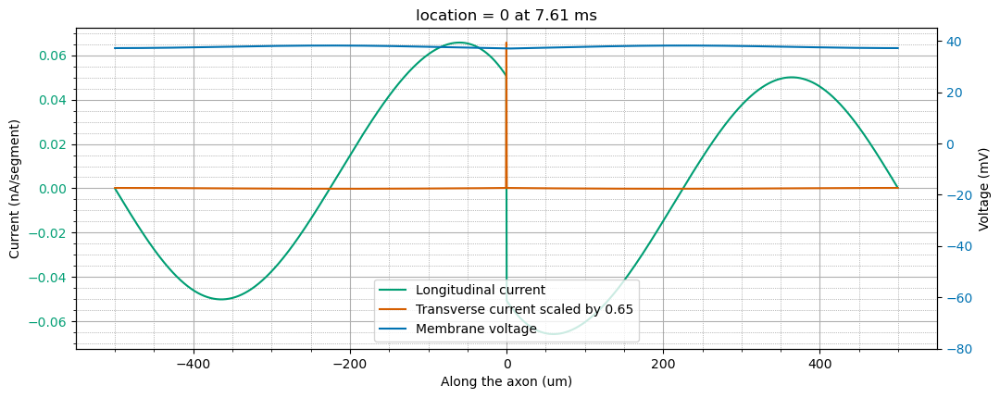

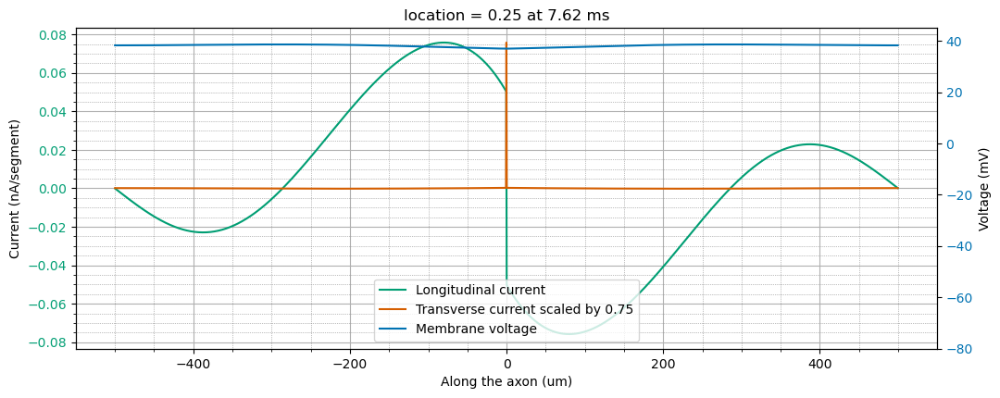

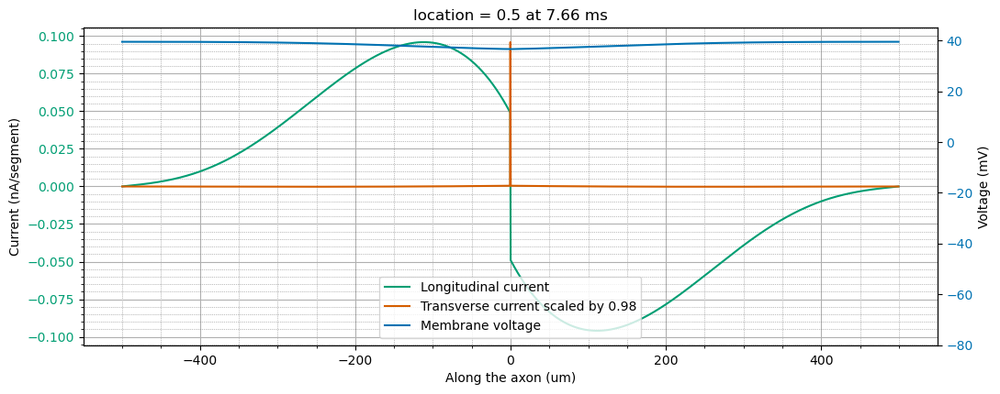

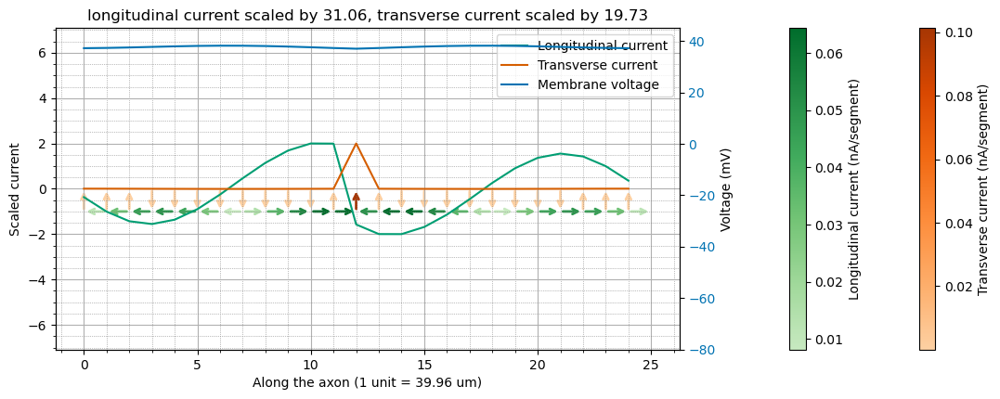

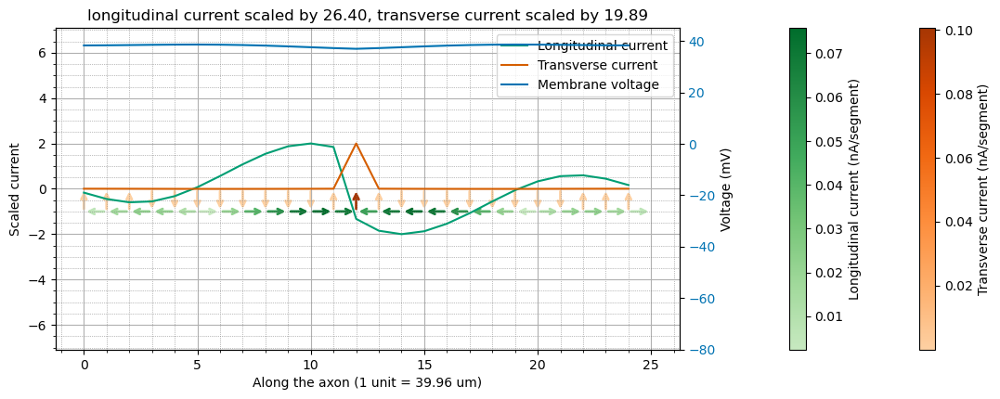

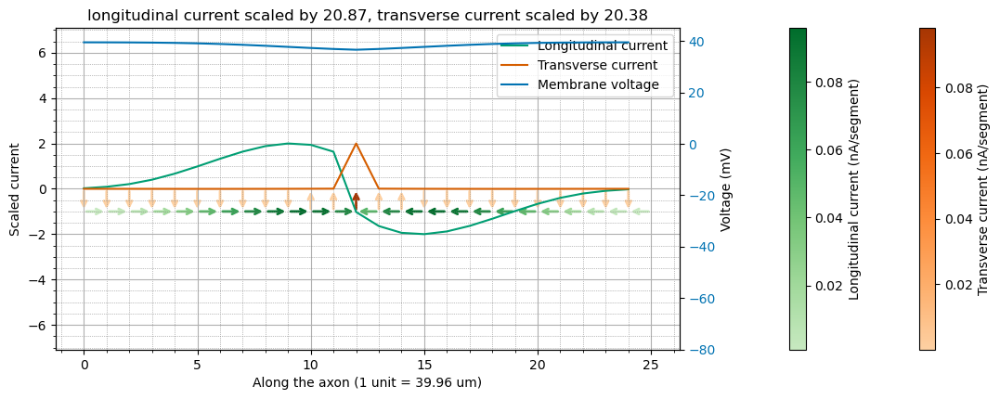

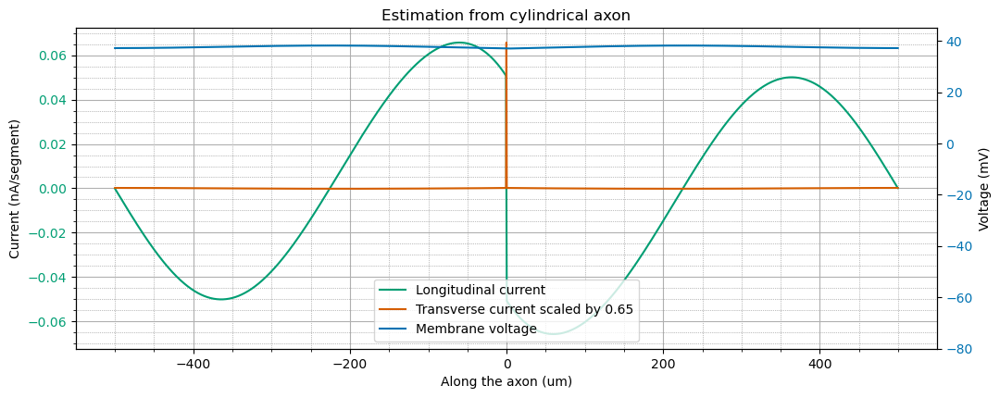

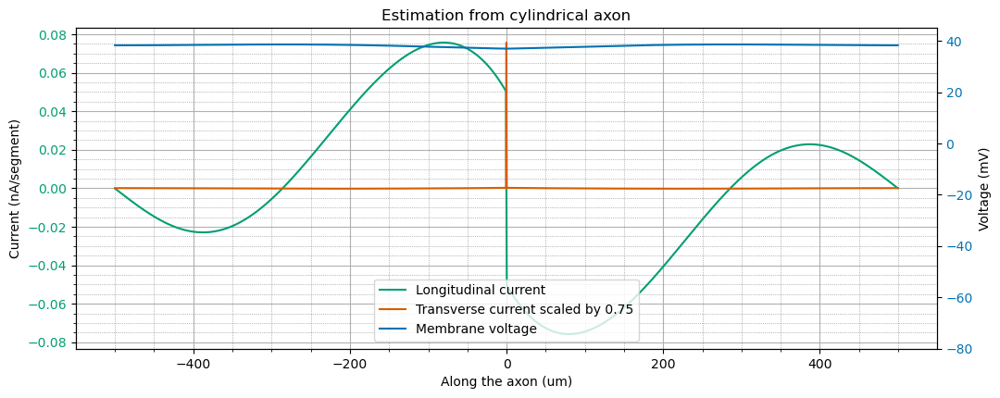

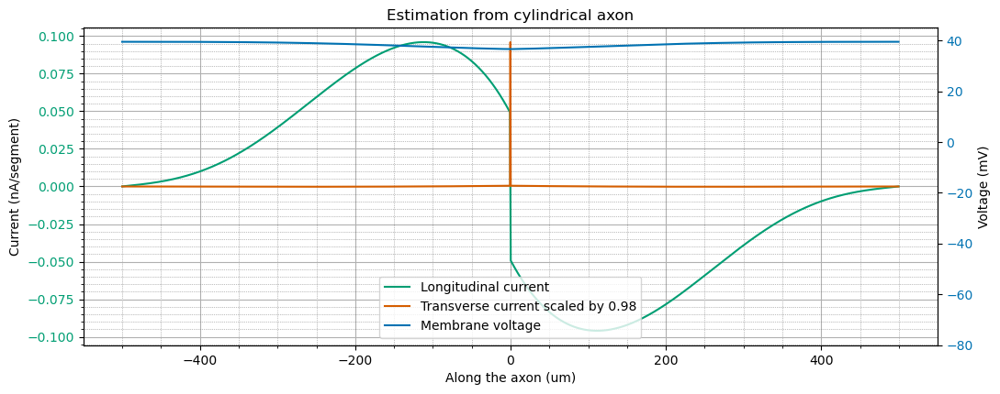

In [3]:
axon_length = 1000
N = 25
synapse_idx, x, vmem, imem, x_iaxial, iaxial = stick(axon_length, 0)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5, N)

time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.25)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.5)
cylindrical_axon(x, vmem[:,time_idx])


|--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

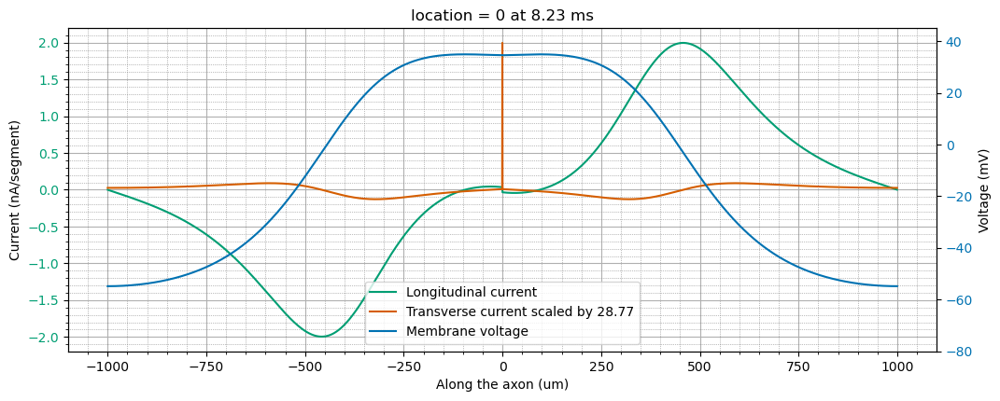

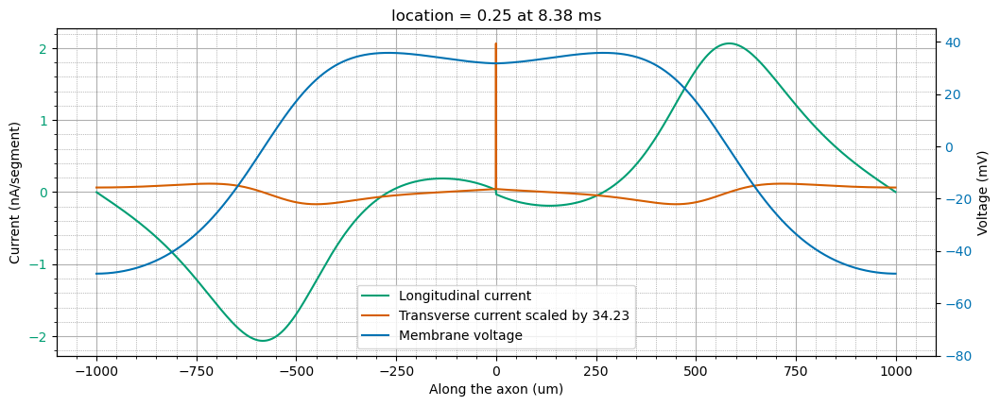

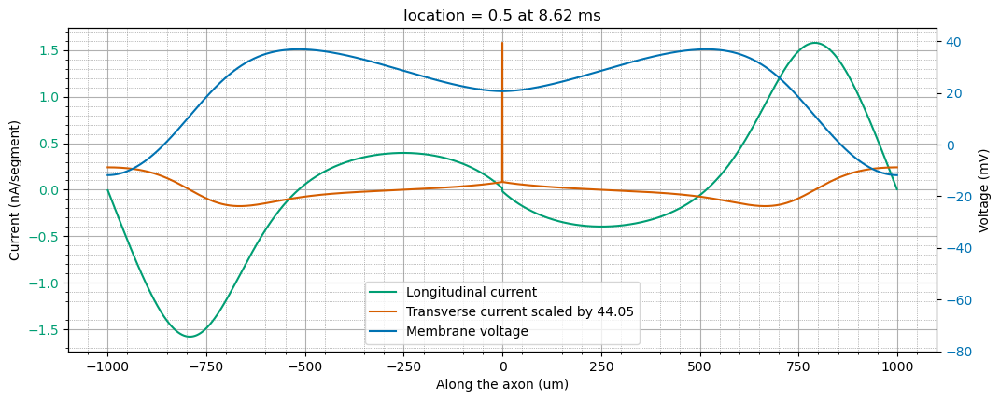

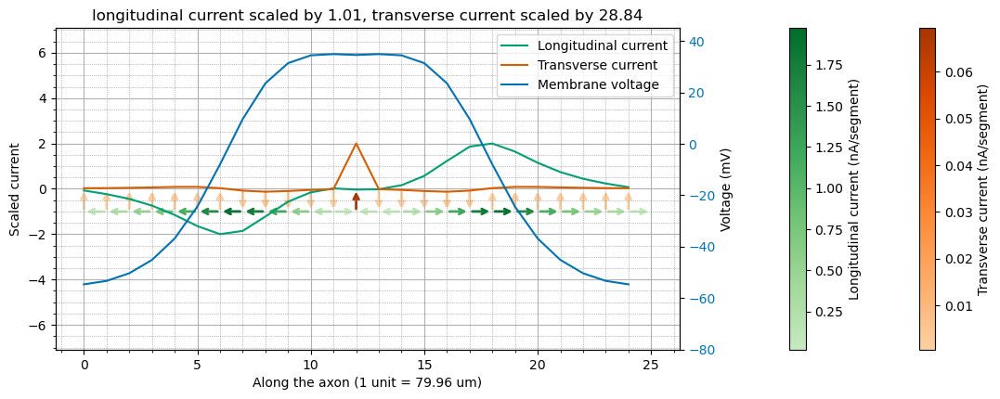

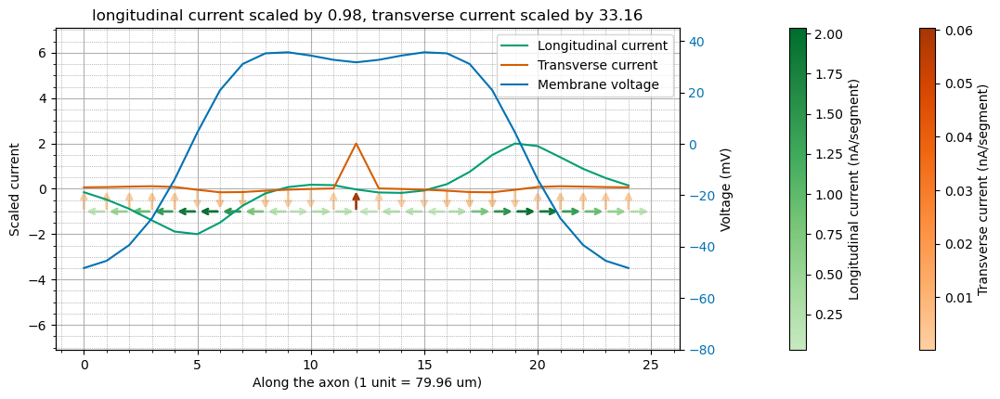

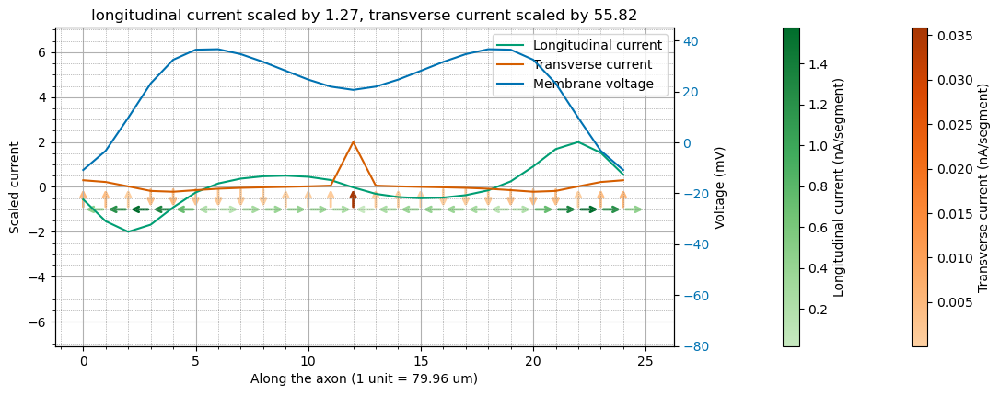

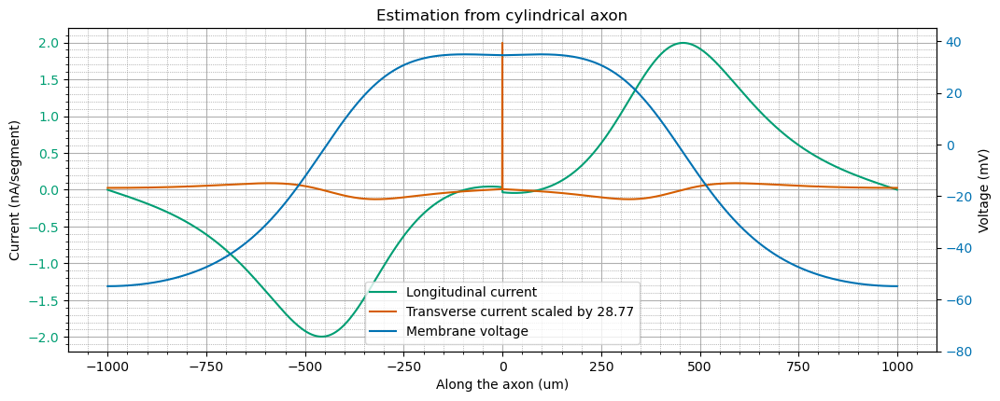

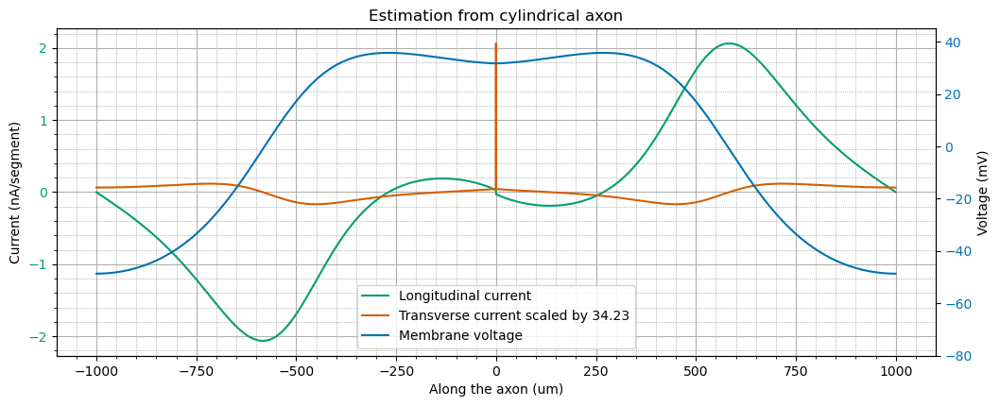

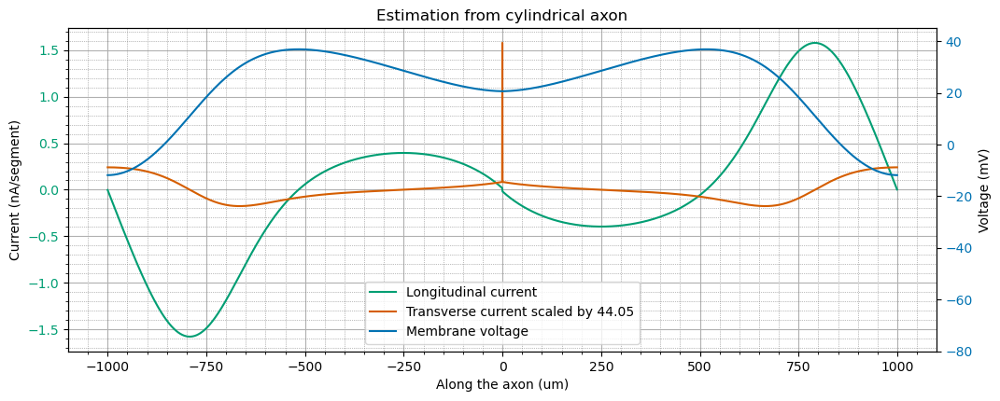

In [4]:
axon_length = 2000
N = 25
synapse_idx, x, vmem, imem, x_iaxial, iaxial = stick(axon_length, 0)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5, N)

time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.25)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.5)
cylindrical_axon(x, vmem[:,time_idx])


|--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

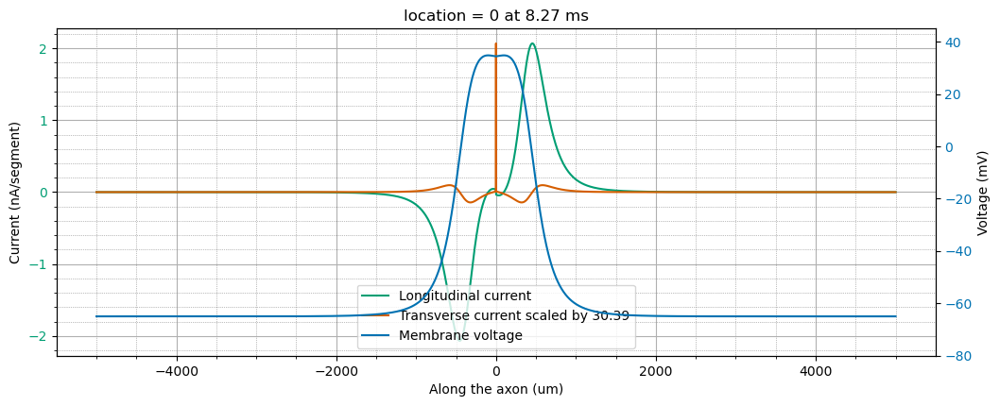

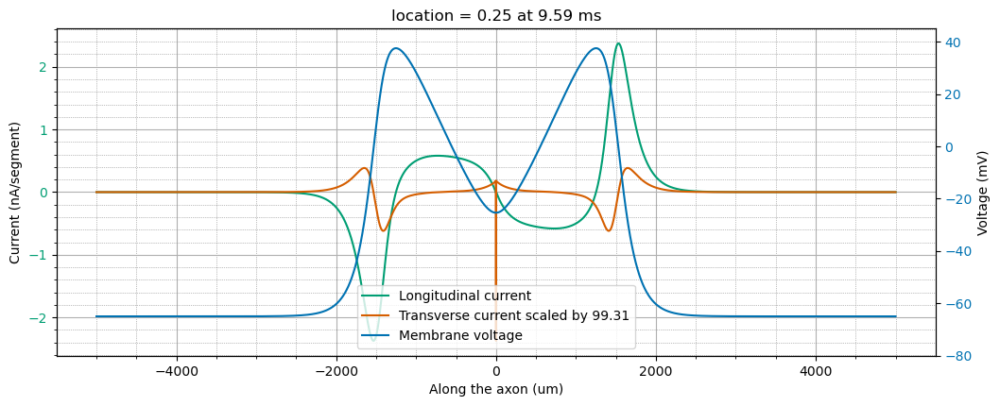

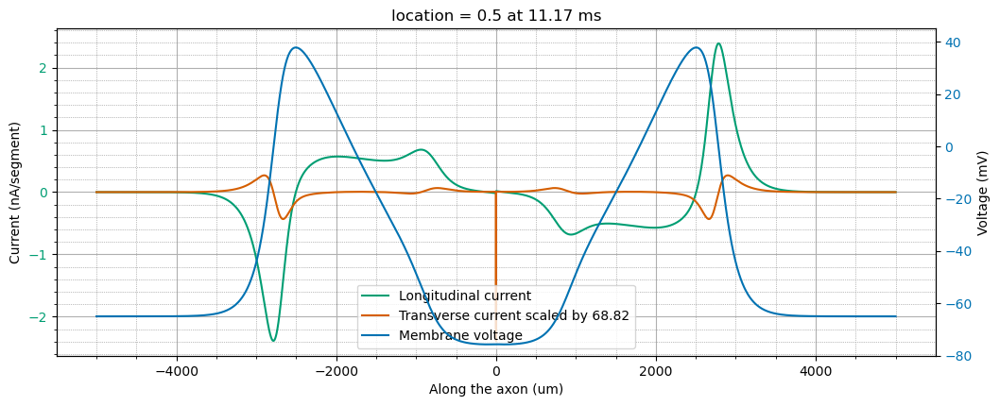

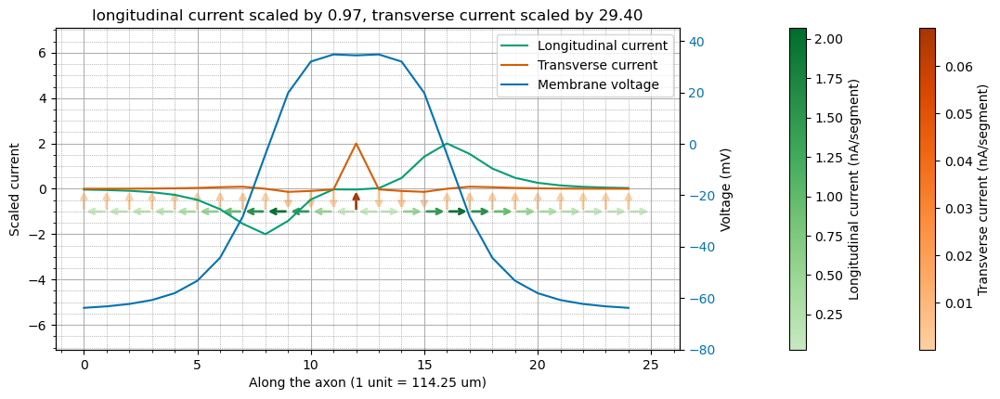

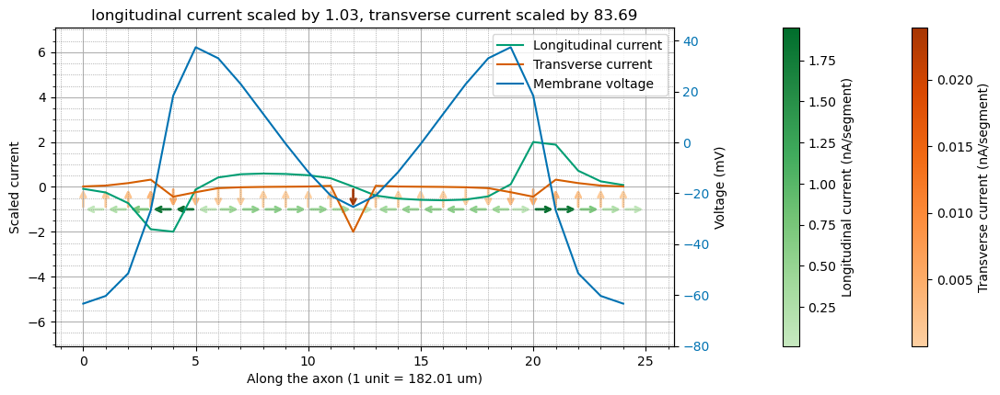

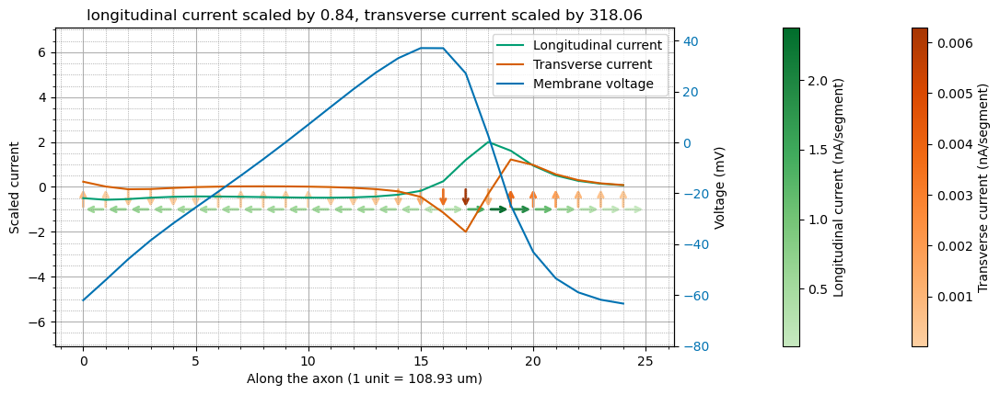

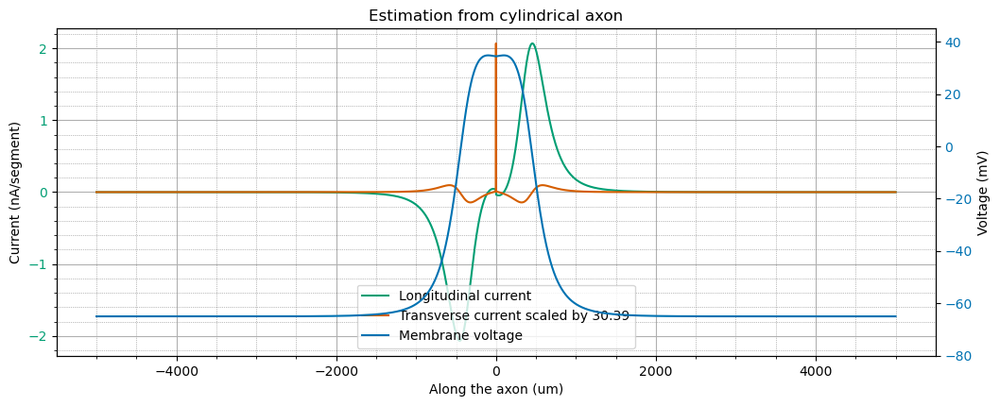

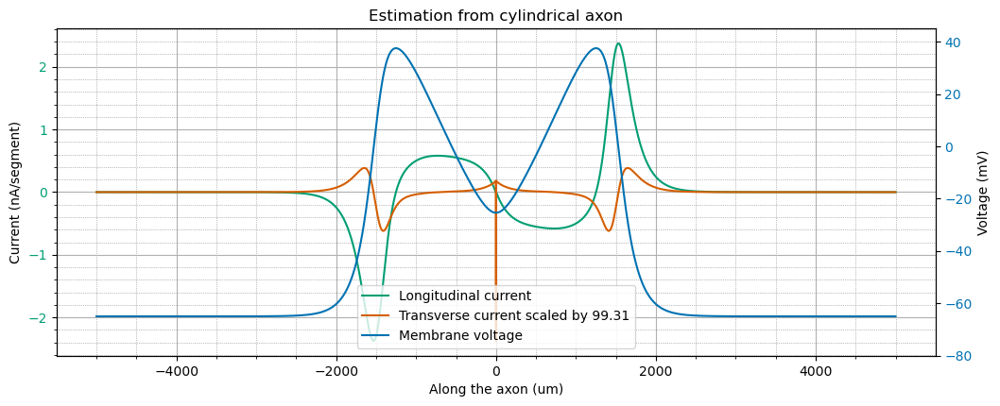

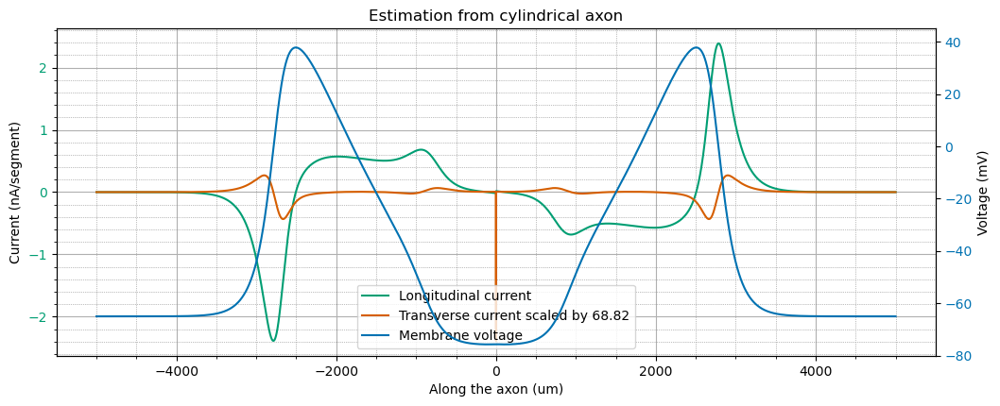

In [5]:
axon_length = 10000
N = 25
synapse_idx, x, vmem, imem, x_iaxial, iaxial = stick(axon_length, 0)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5, N)

time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.25)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.5)
cylindrical_axon(x, vmem[:,time_idx])


|-|       soma(0-1)
   `---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

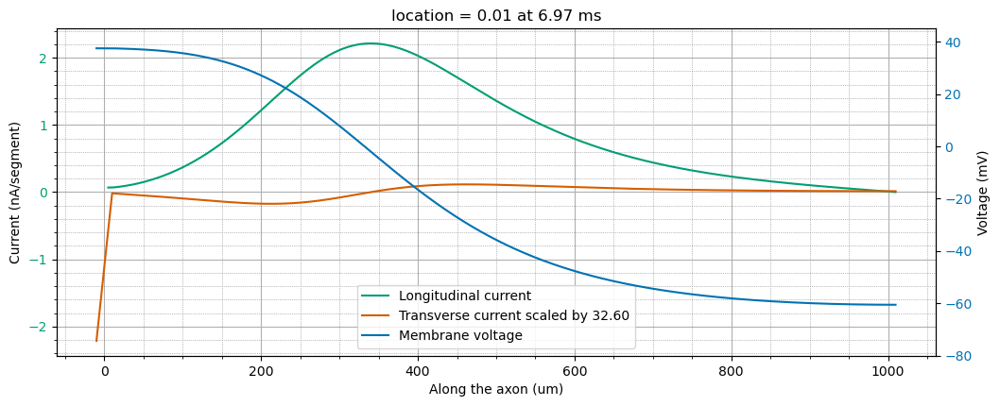

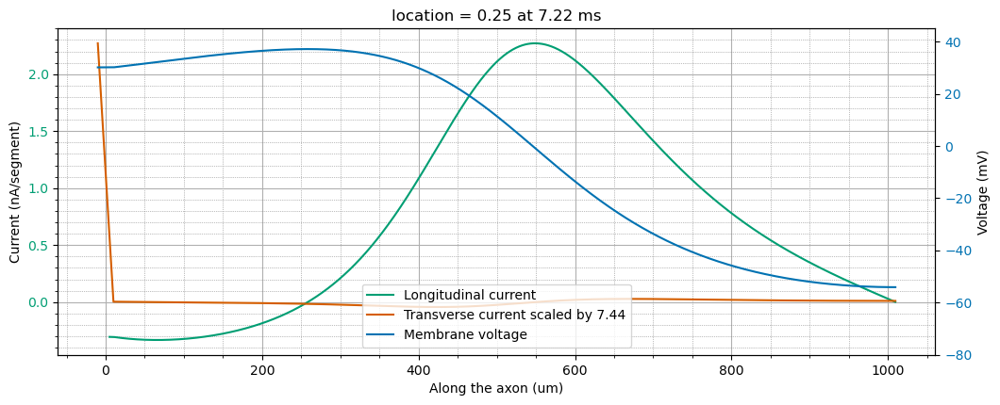

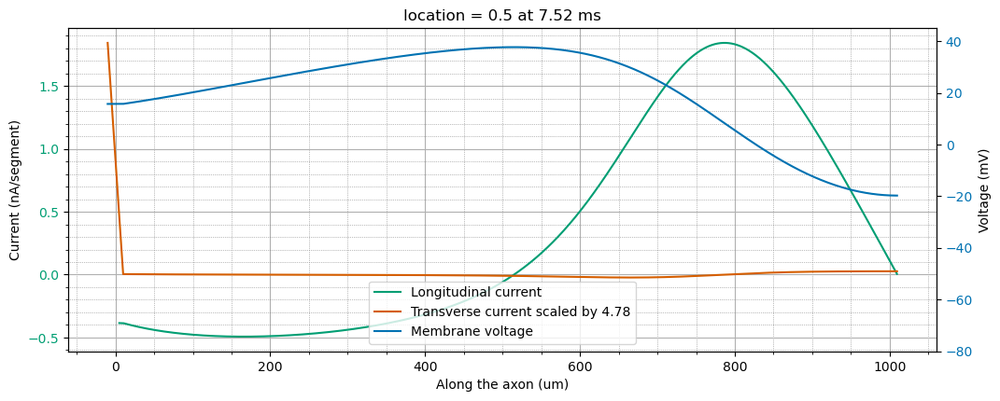

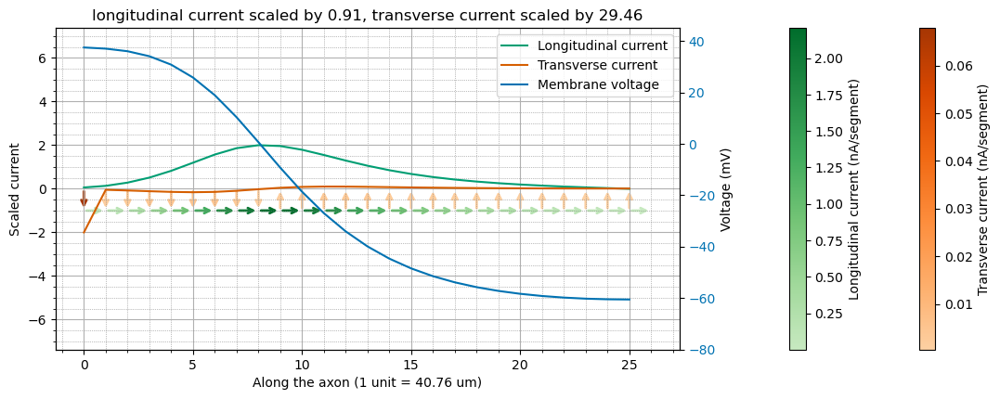

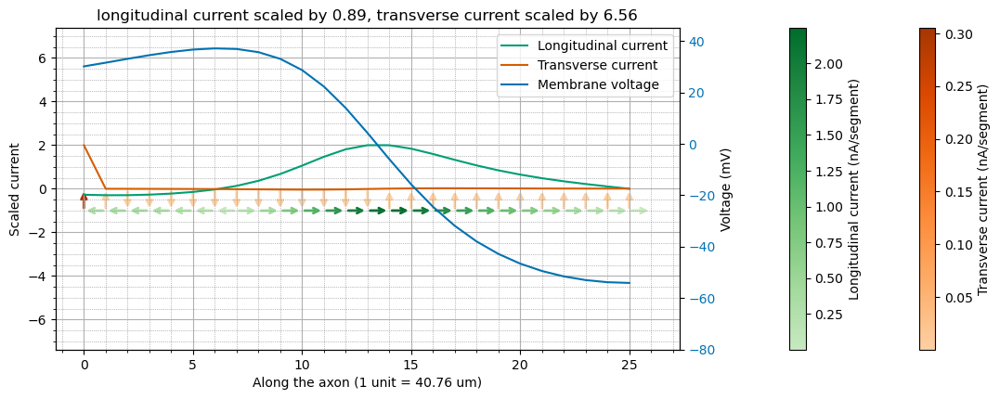

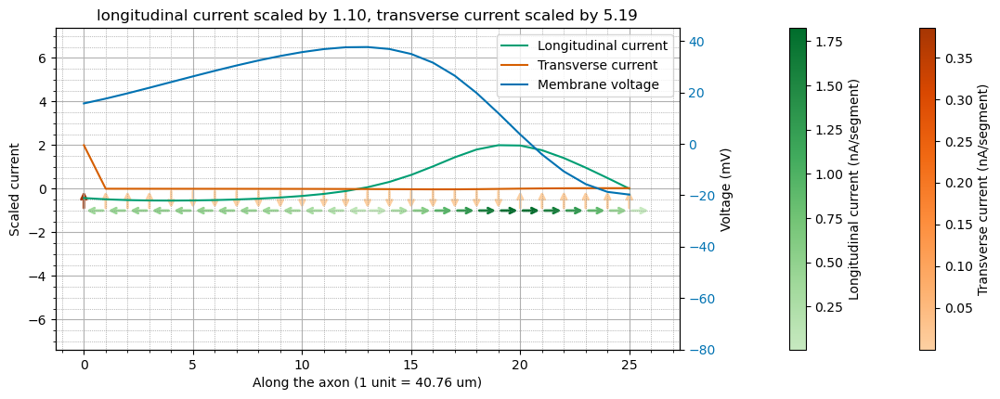

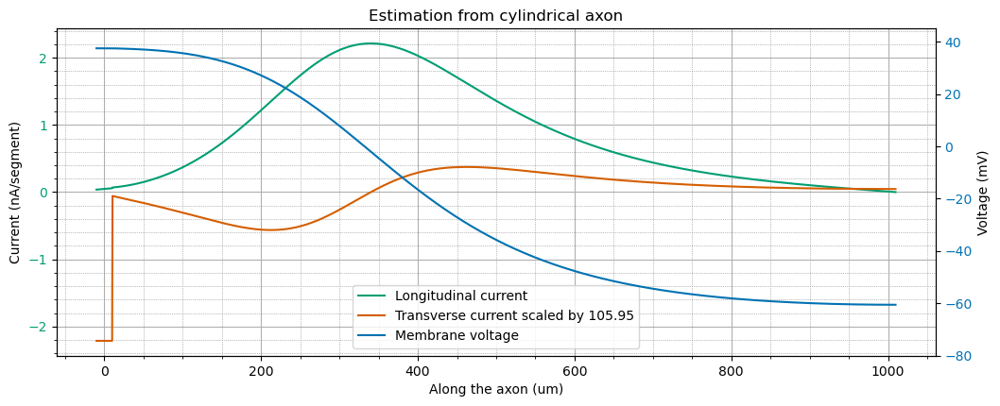

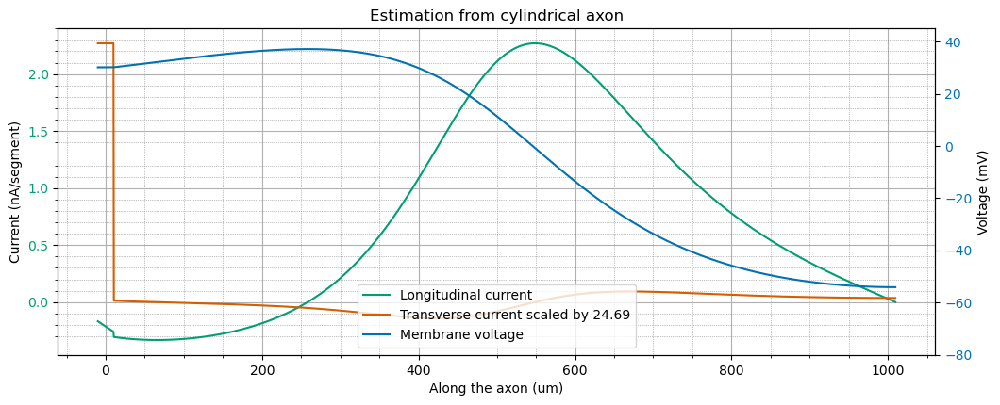

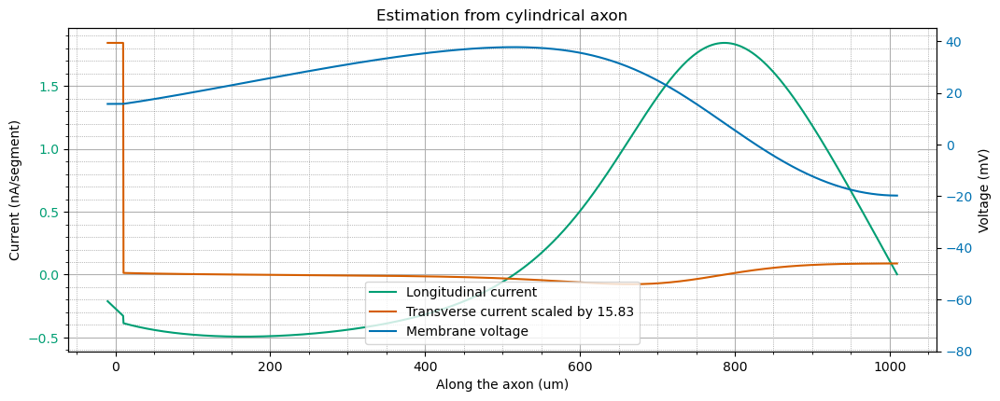

In [6]:
axon_length = 1000  # Axon length in um
soma_diameter = 20  # Spherical soma diameter in um
N = 25

synapse_idx, x, vmem, imem, x_iaxial, iaxial = ball_stick(axon_length, soma_diameter, 0)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, soma_diameter/2/axon_length)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, soma_diameter/2/axon_length, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5, N)

time_idx, space_idx = find_idx(synapse_idx, x, vmem, soma_diameter/2/axon_length)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.25)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.5)
cylindrical_axon(x, vmem[:,time_idx])


|-|       soma(0-1)
   `---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

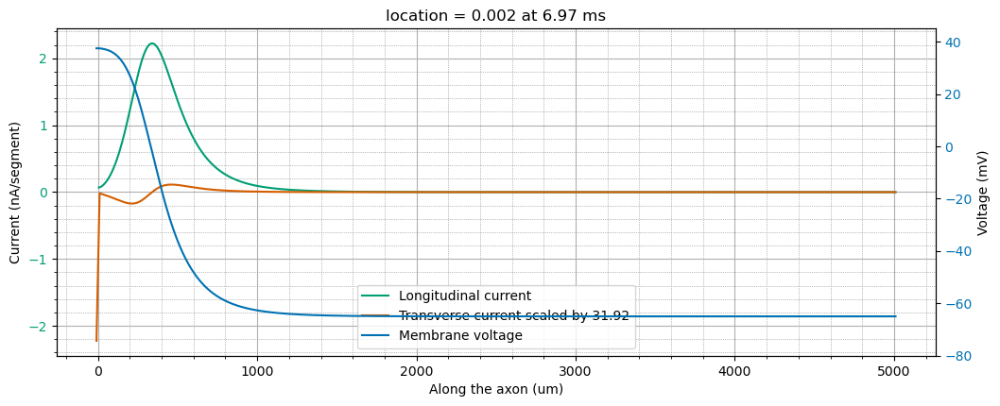

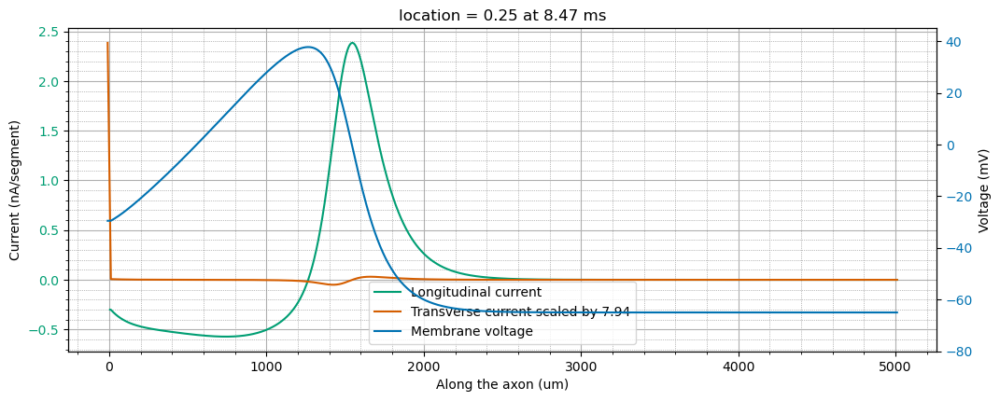

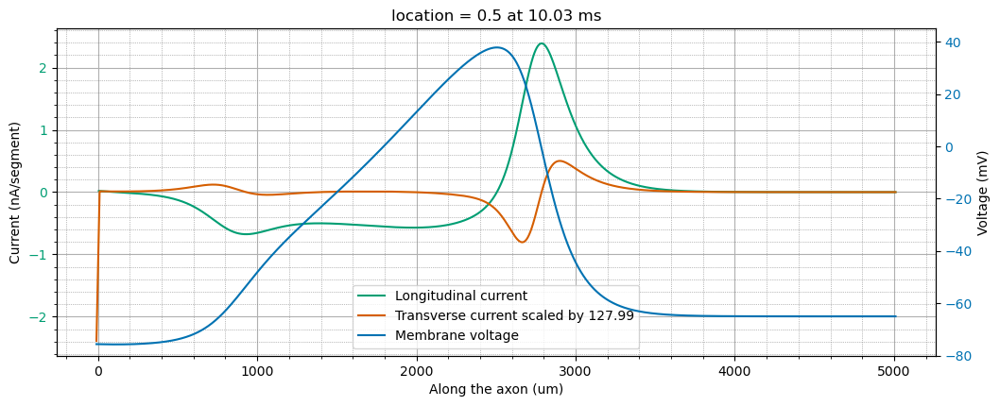

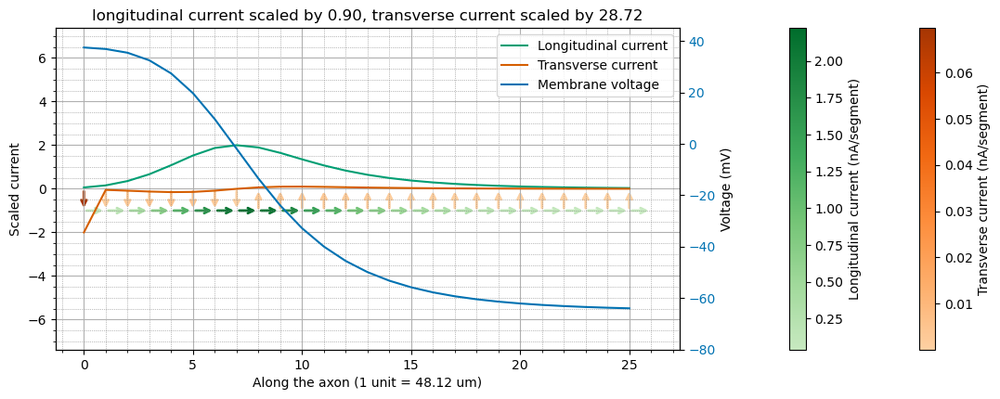

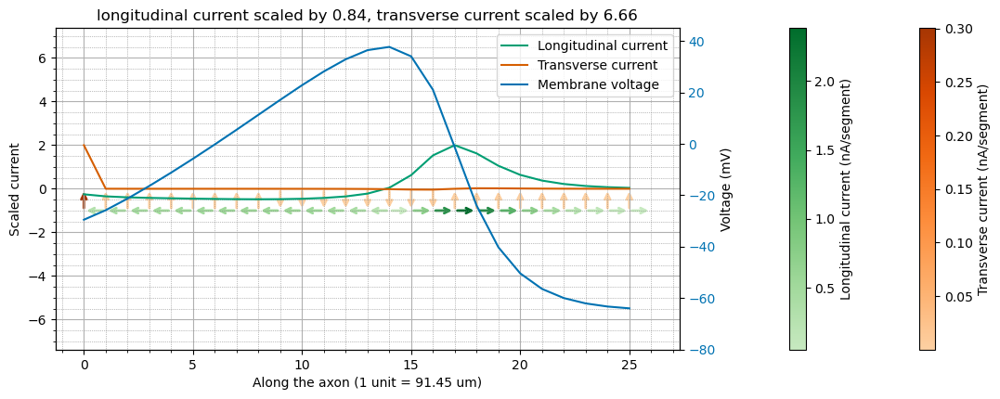

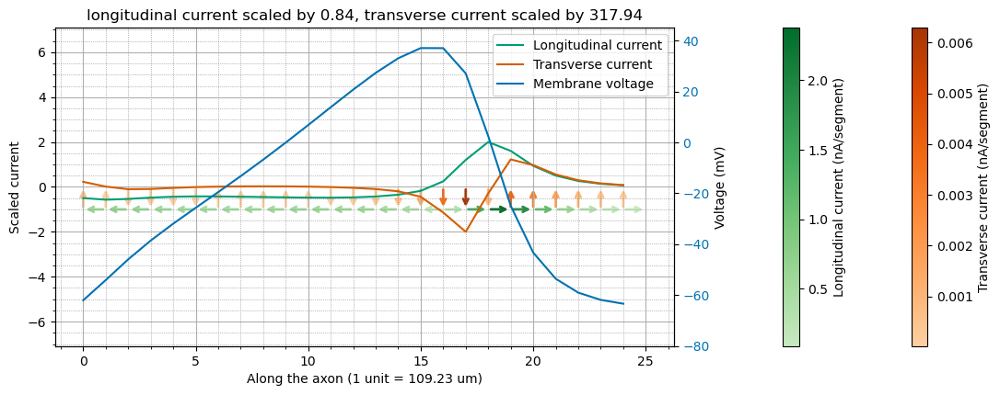

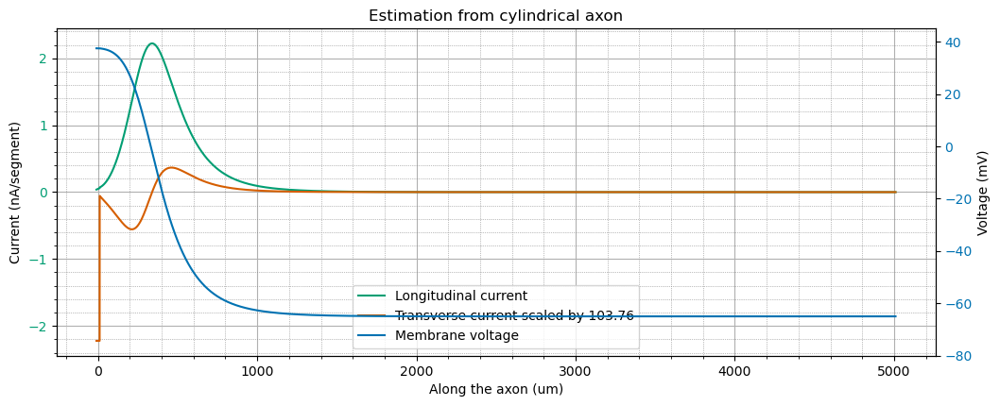

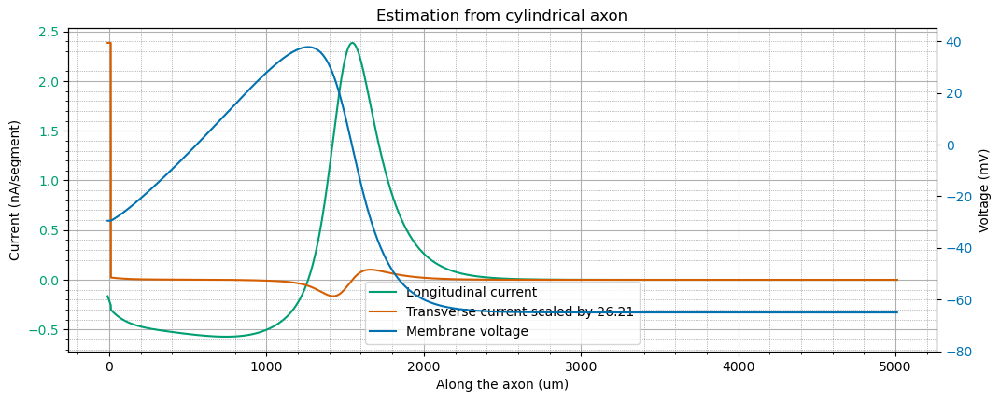

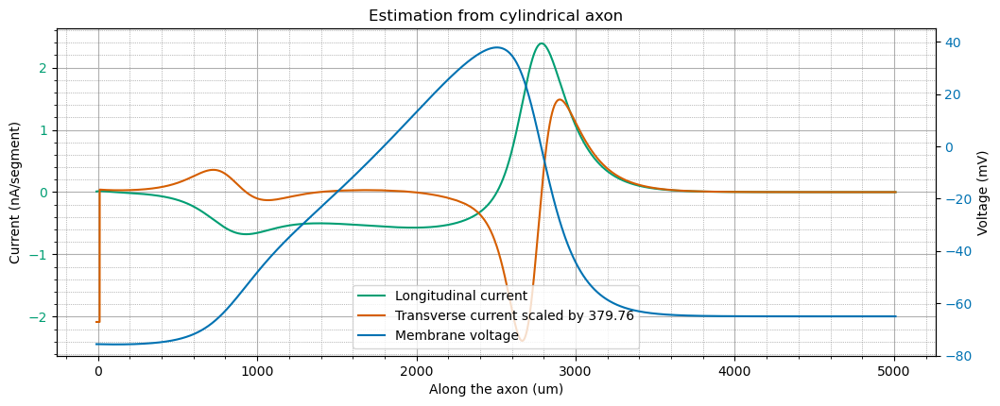

In [7]:
axon_length = 5000  # Axon length in um
soma_diameter = 20  # Spherical soma diameter in um
N = 25

synapse_idx, x, vmem, imem, x_iaxial, iaxial = ball_stick(axon_length, soma_diameter, 0)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, soma_diameter/2/axon_length)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, soma_diameter/2/axon_length, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5, N)

time_idx, space_idx = find_idx(synapse_idx, x, vmem, soma_diameter/2/axon_length)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.25)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.5)
cylindrical_axon(x, vmem[:,time_idx])


|-|       soma(0-1)
   `---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

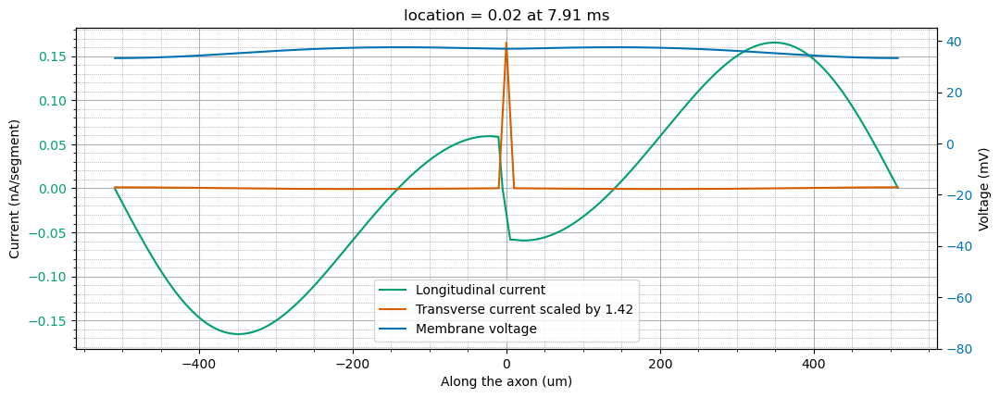

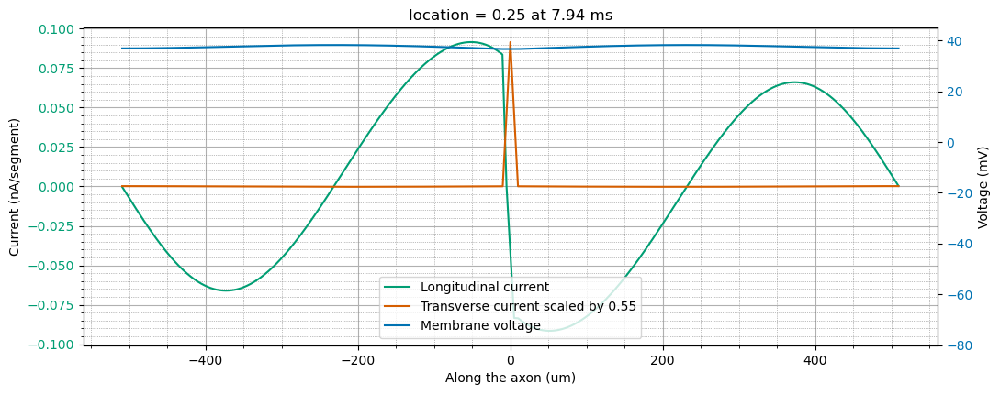

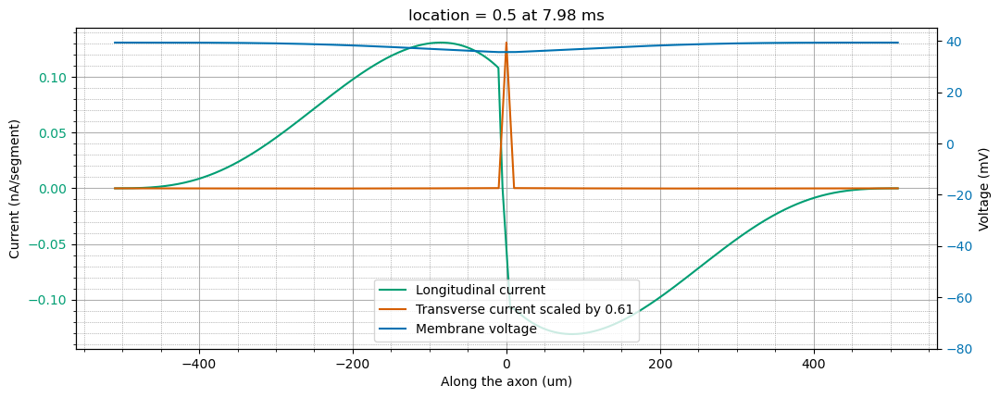

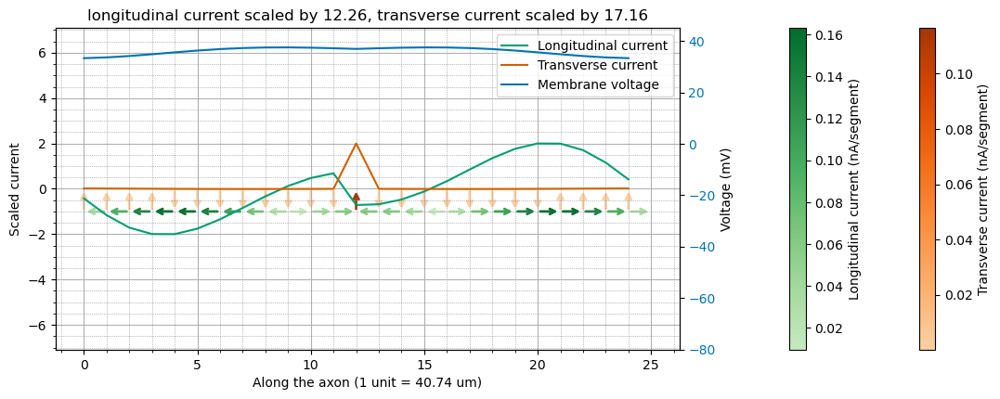

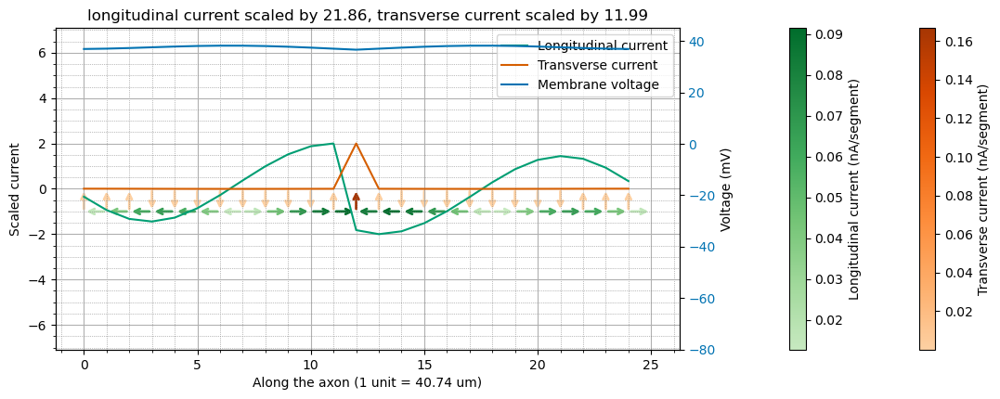

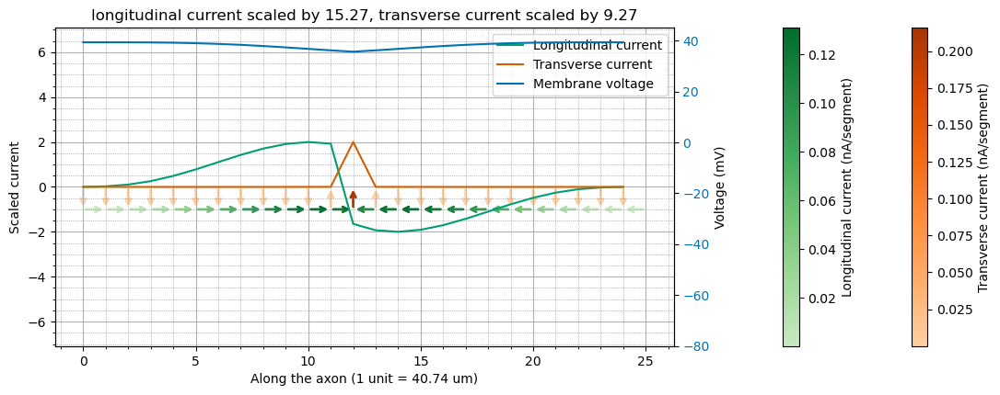

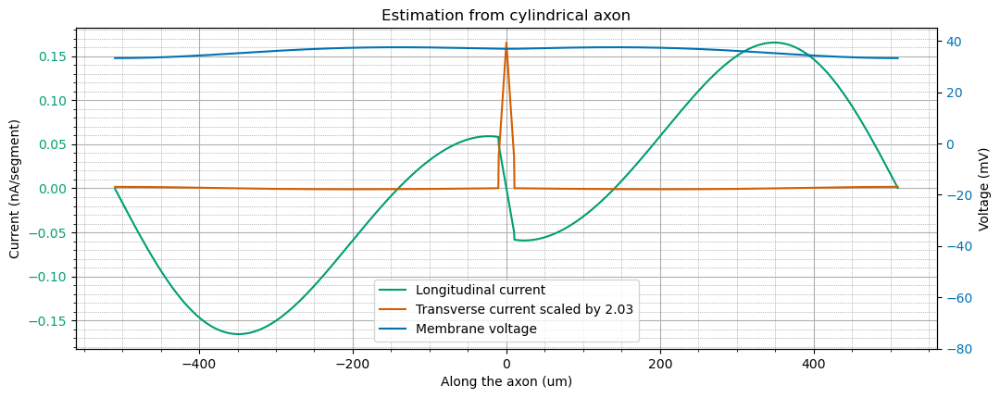

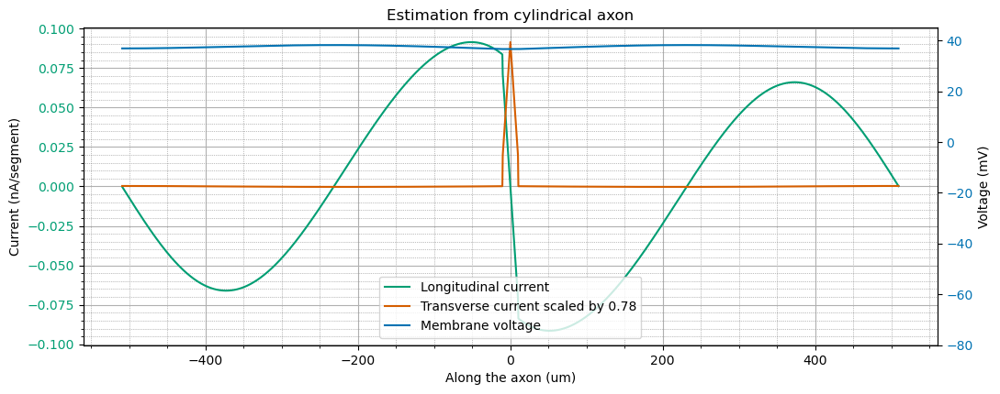

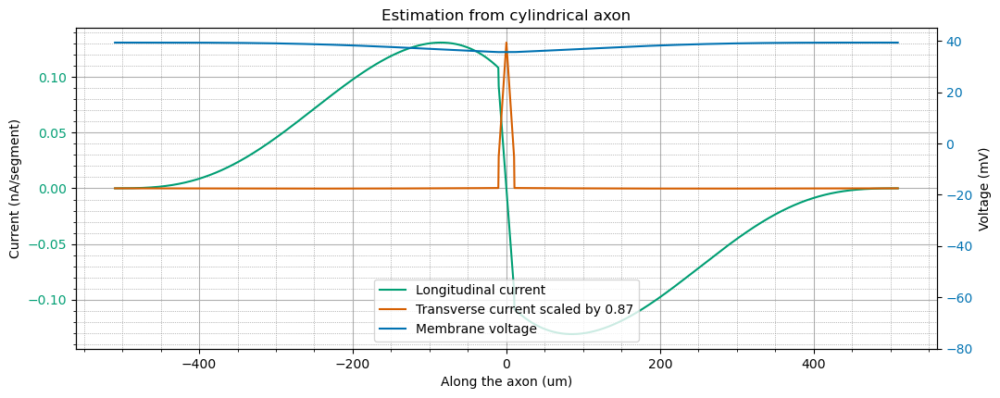

In [8]:
dent_length = 500  # Axon length in um
axon_length = 500  # Axon length in um
soma_diameter = 20  # Spherical soma diameter in um
N = 25

synapse_idx, x, vmem, imem, x_iaxial, iaxial = stick_ball_stick(dent_length, axon_length, soma_diameter, 0)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, soma_diameter/2/axon_length)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, soma_diameter/2/axon_length, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5, N)

time_idx, space_idx = find_idx(synapse_idx, x, vmem, soma_diameter/2/axon_length)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.25)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.5)
cylindrical_axon(x, vmem[:,time_idx])


|-|       soma(0-1)
   `---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

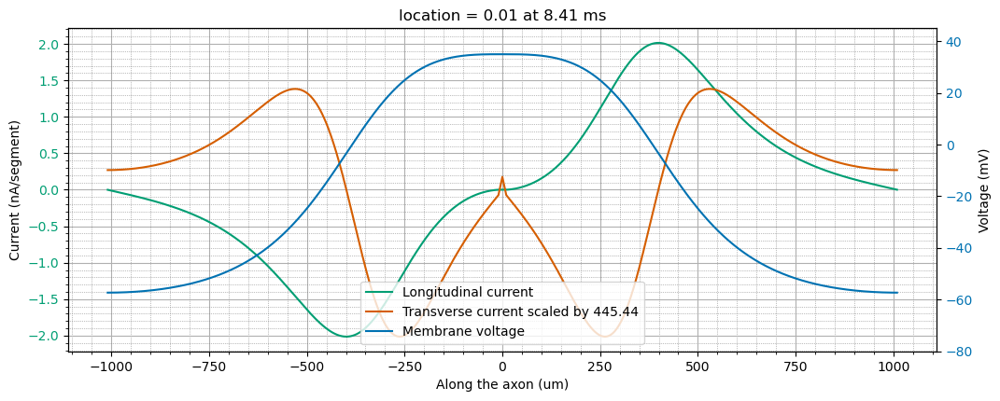

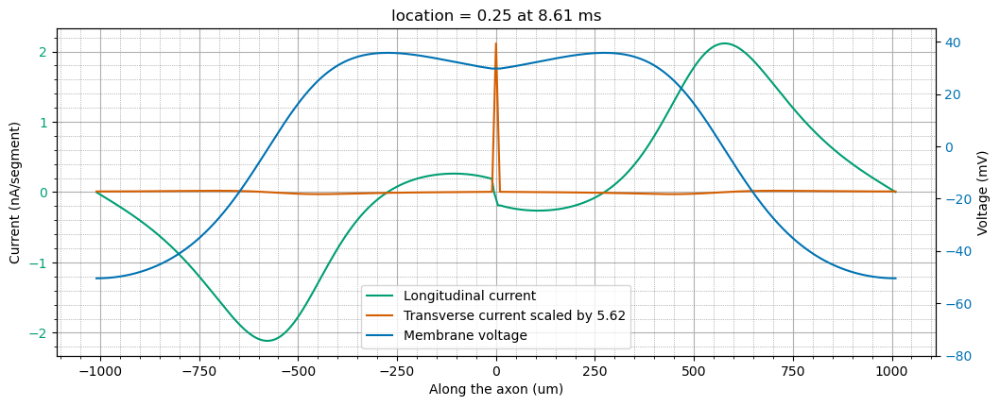

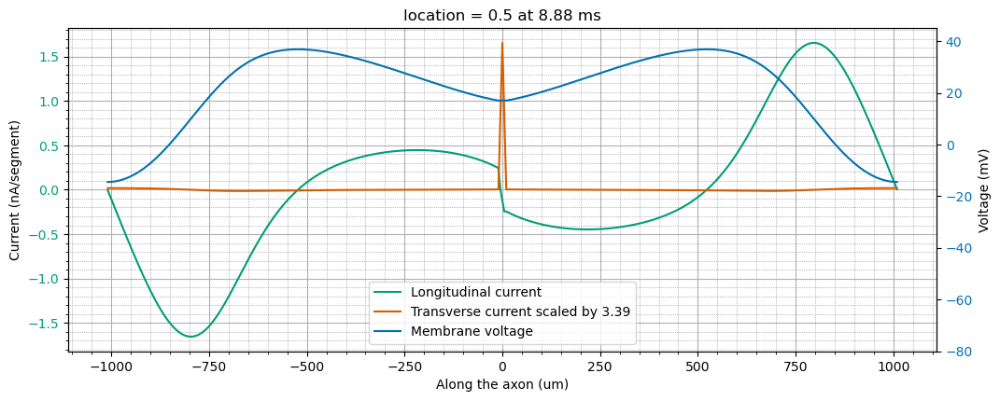

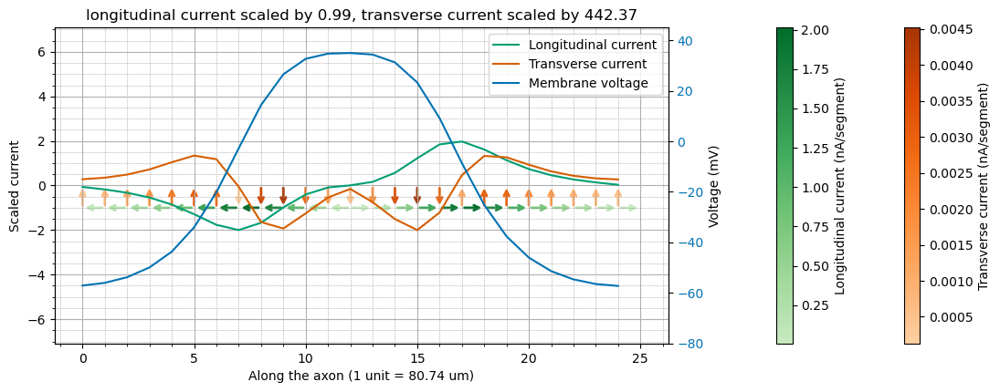

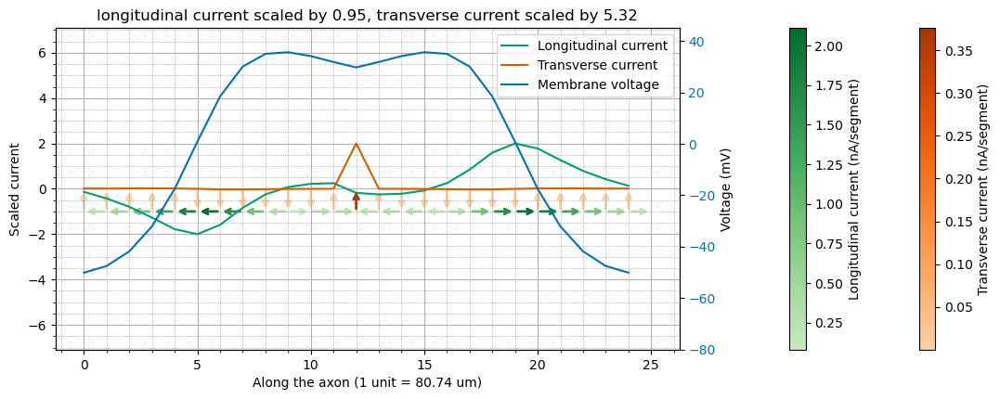

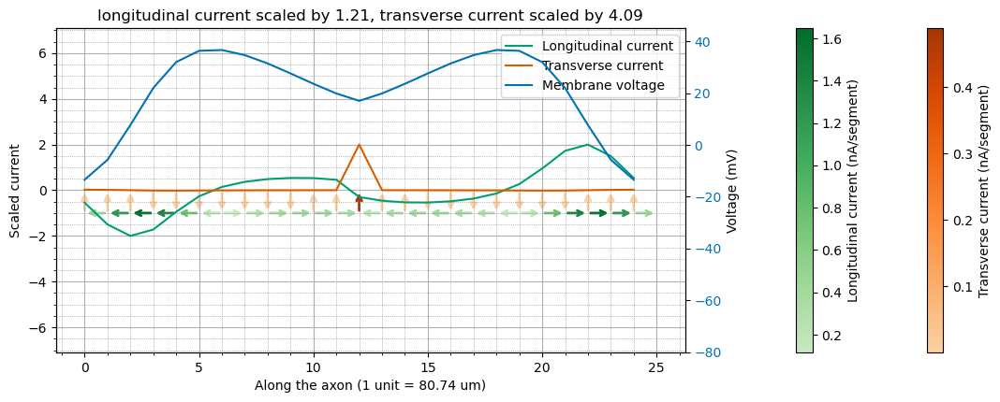

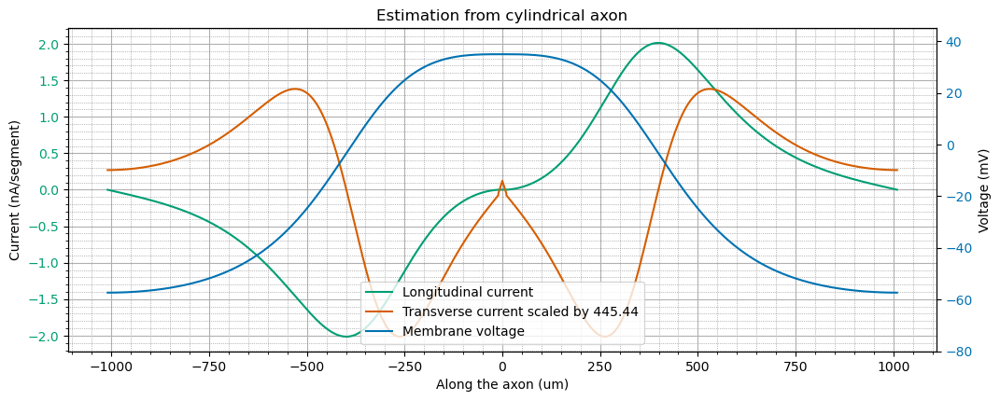

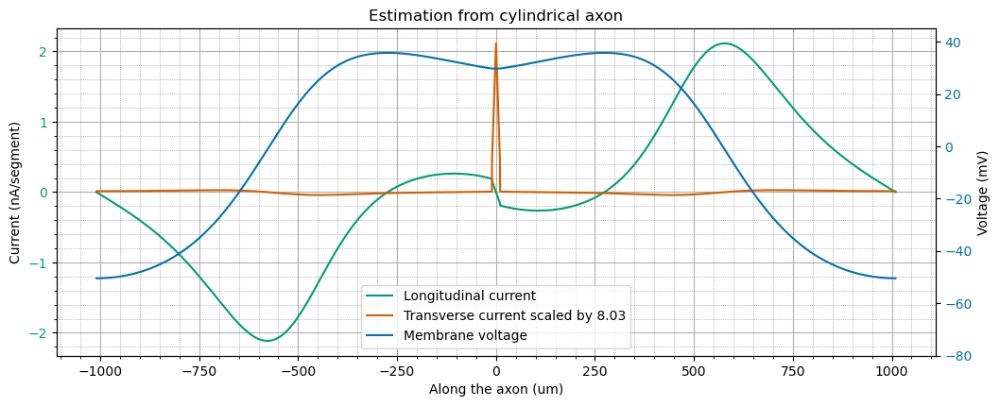

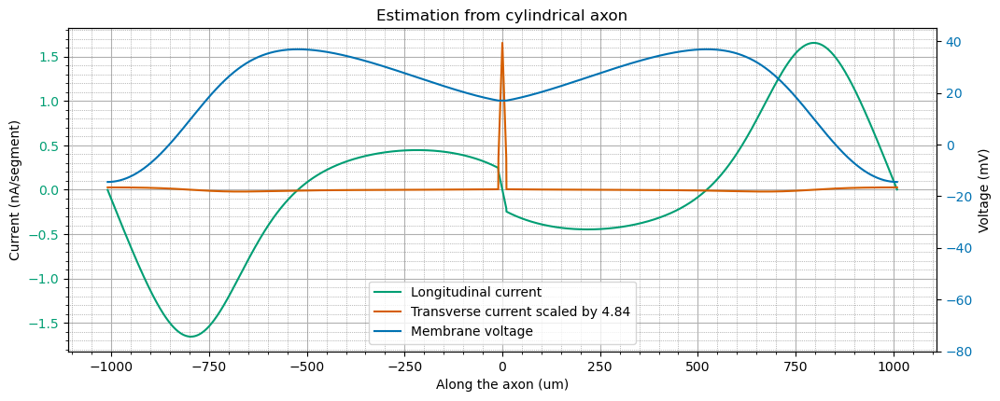

In [9]:
dent_length = 1000  # Axon length in um
axon_length = 1000  # Axon length in um
soma_diameter = 20  # Spherical soma diameter in um
N = 25

synapse_idx, x, vmem, imem, x_iaxial, iaxial = stick_ball_stick(dent_length, axon_length, soma_diameter, 0)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, soma_diameter/2/axon_length)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, soma_diameter/2/axon_length, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5, N)

time_idx, space_idx = find_idx(synapse_idx, x, vmem, soma_diameter/2/axon_length)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.25)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.5)
cylindrical_axon(x, vmem[:,time_idx])


|-|       soma(0-1)
   `---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

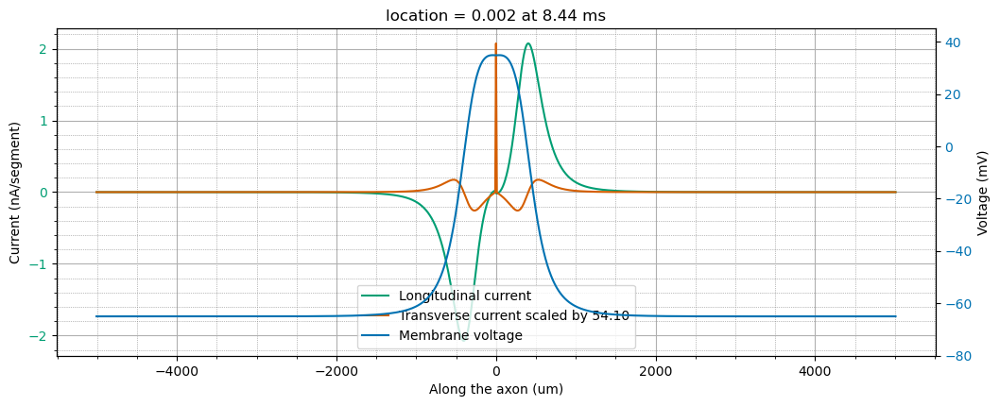

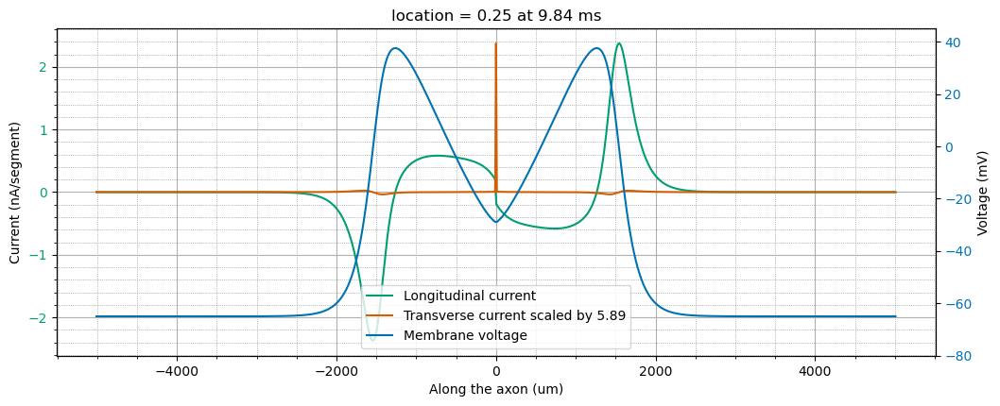

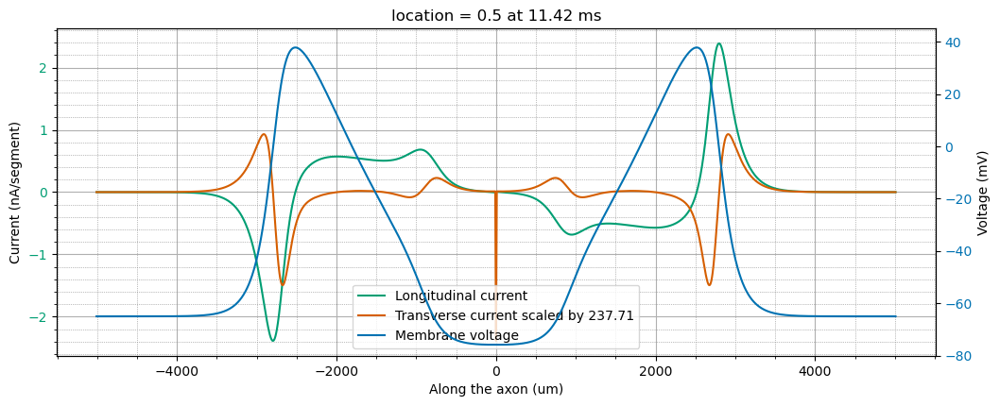

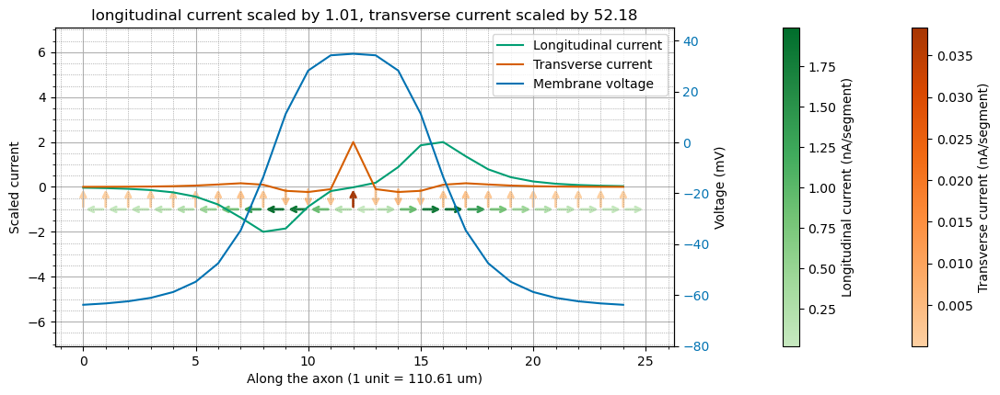

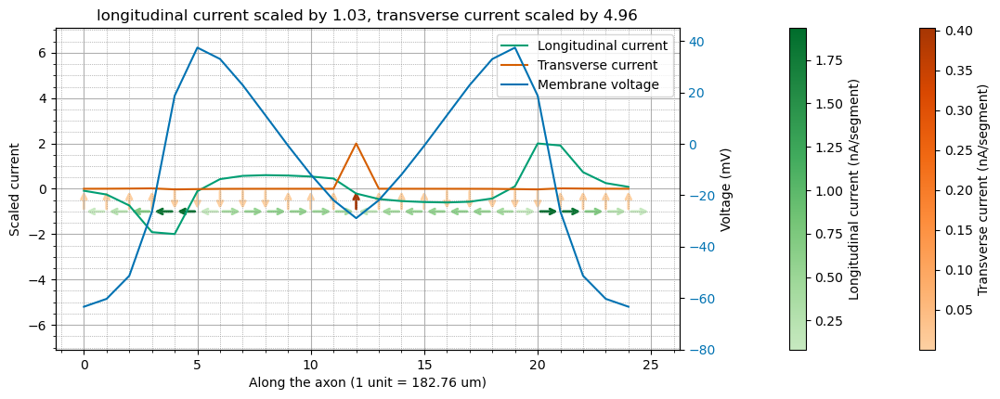

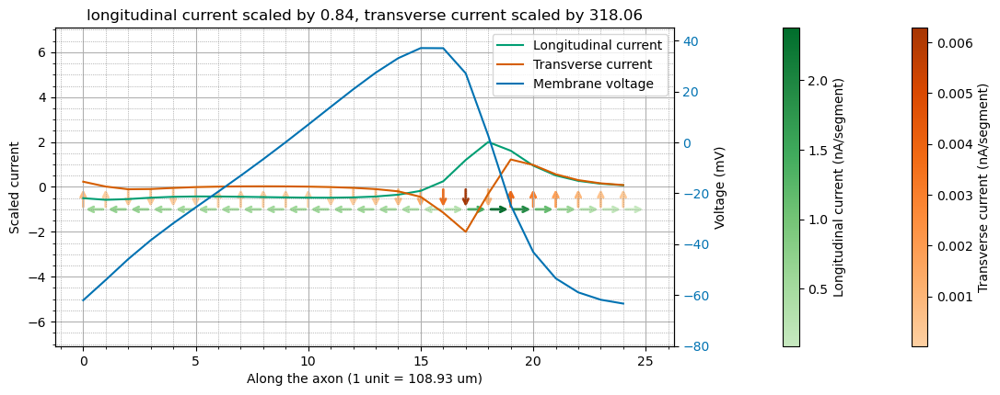

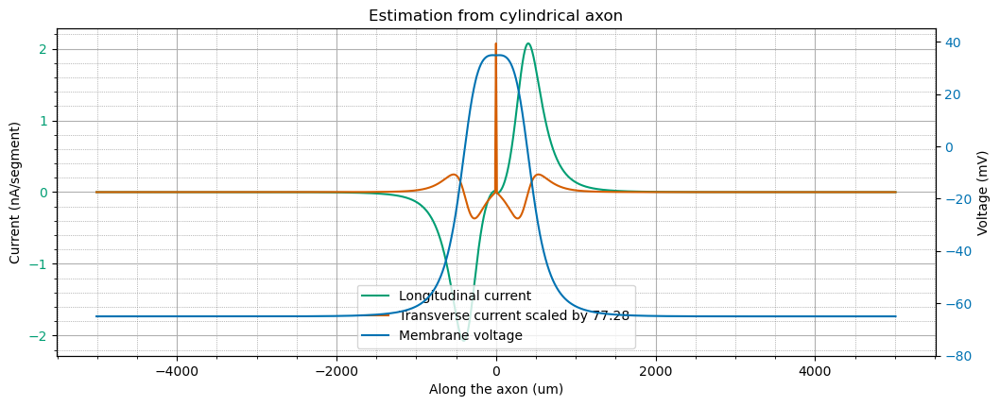

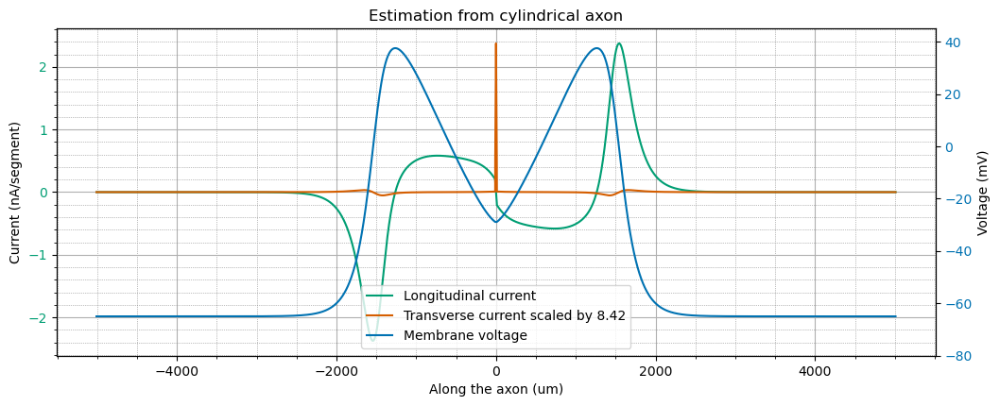

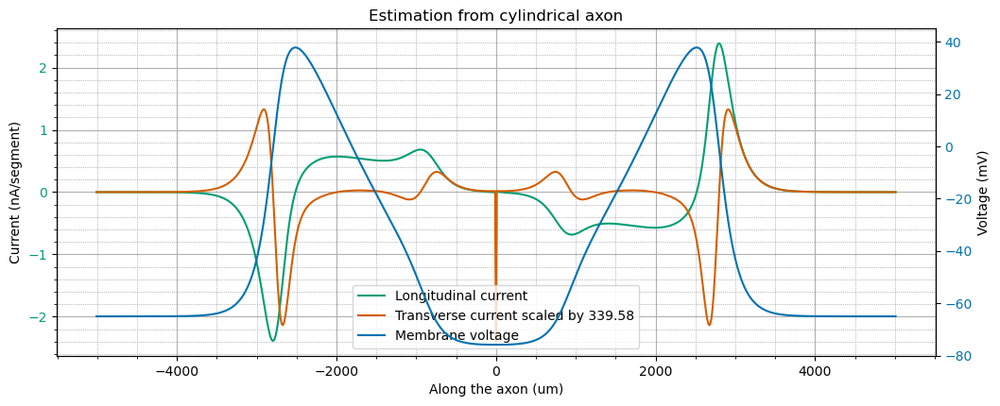

In [10]:
dent_length = 5000  # Axon length in um
axon_length = 5000  # Axon length in um
soma_diameter = 20  # Spherical soma diameter in um
N = 25

synapse_idx, x, vmem, imem, x_iaxial, iaxial = stick_ball_stick(dent_length, axon_length, soma_diameter, 0)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, soma_diameter/2/axon_length)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25)
plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, soma_diameter/2/axon_length, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5, N)

time_idx, space_idx = find_idx(synapse_idx, x, vmem, soma_diameter/2/axon_length)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.25)
cylindrical_axon(x, vmem[:,time_idx])
time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.5)
cylindrical_axon(x, vmem[:,time_idx])

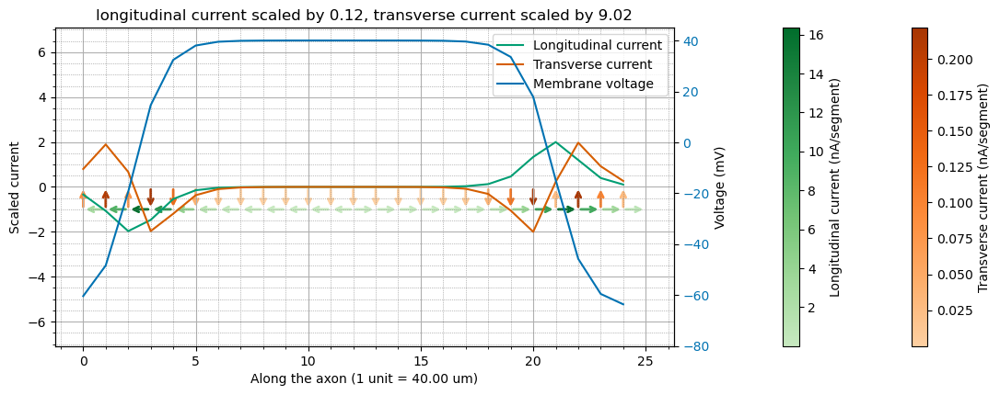

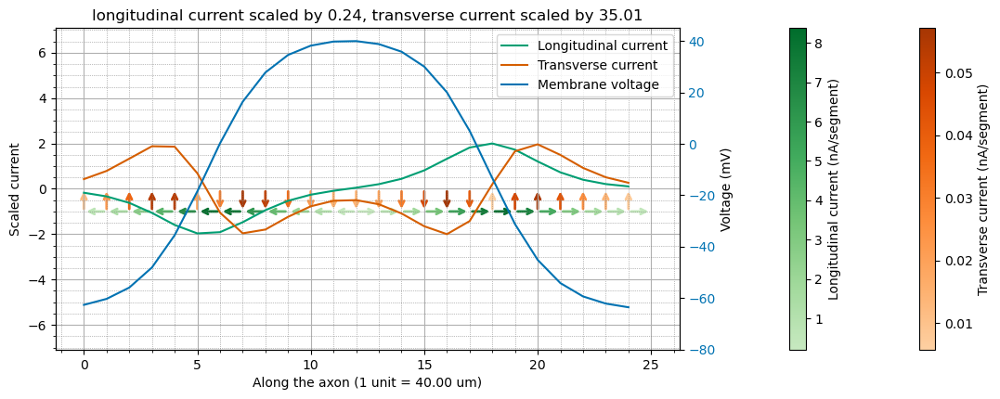

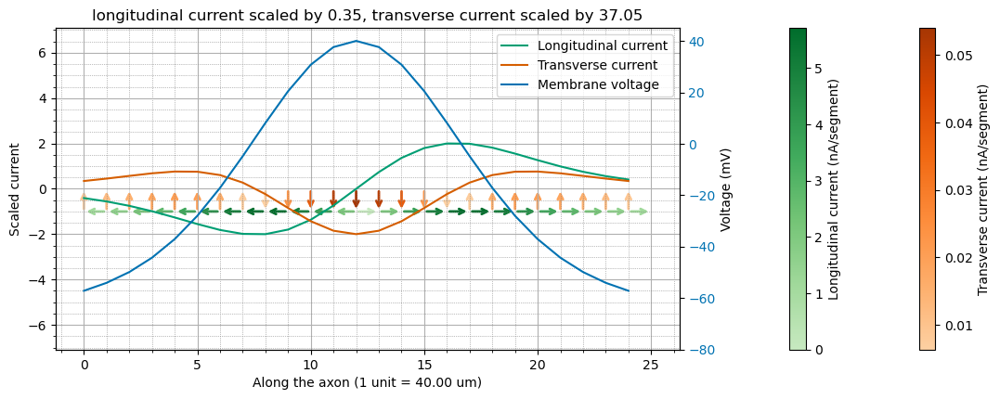

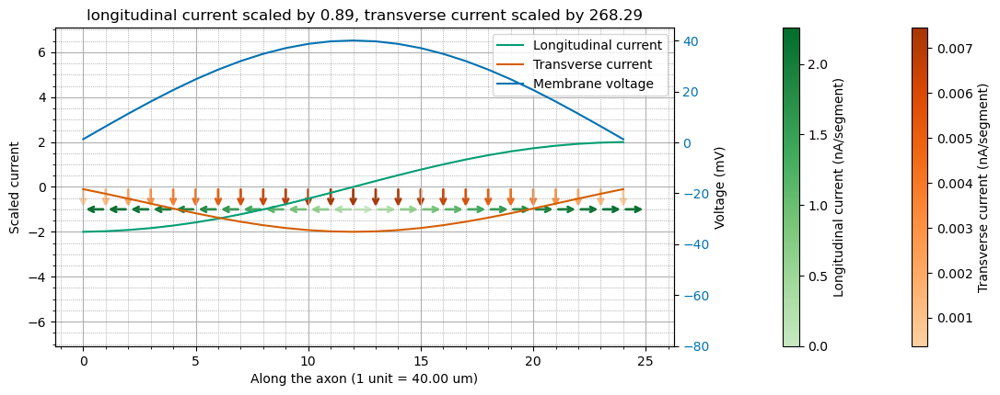

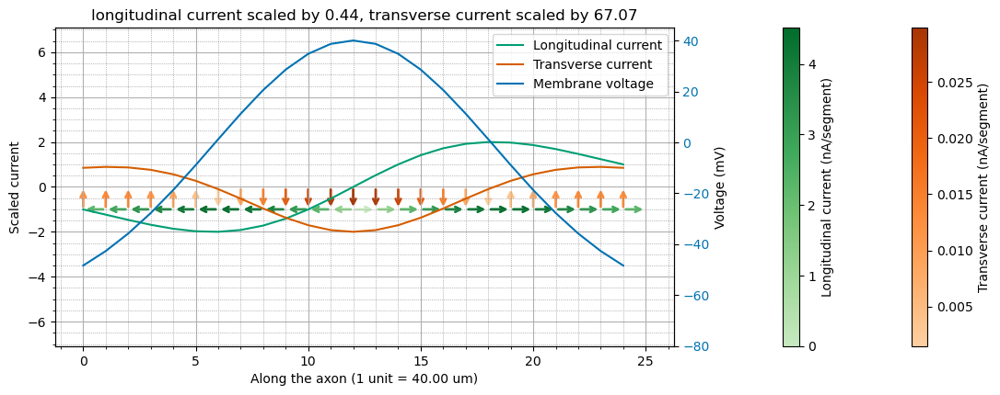

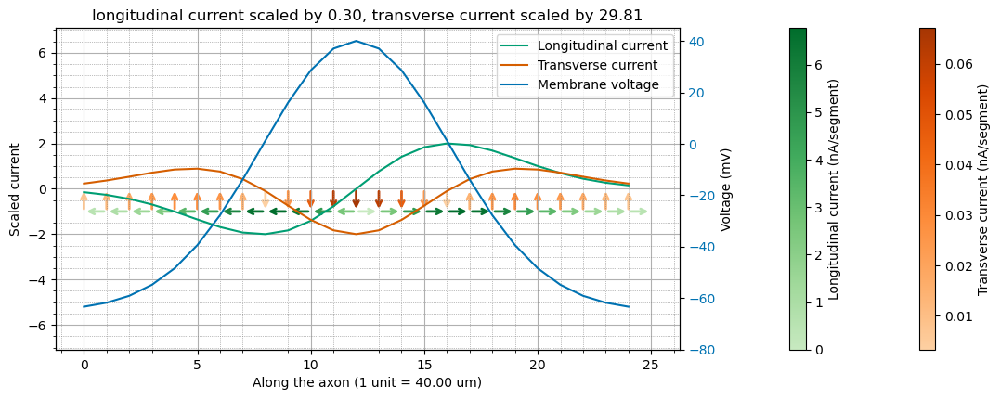

In [11]:
axon_length = 1000
N = 25
vmem_two_sided_sigmoid(axon_length, axon_length * .75, axon_length * 0.125, N)
vmem_two_sided_sigmoid(axon_length, axon_length * .5, axon_length * .25, N)
vmem_two_sided_sigmoid(axon_length, axon_length * .25, axon_length * .5, N)

vmem_gaussian(axon_length, axon_length/2, N)
vmem_gaussian(axon_length, axon_length/4, N)
vmem_gaussian(axon_length, axon_length/6, N)


|-|       soma(0-1)
   `---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

/var/folders/df/rk7rf_5s4253kn_8sb19p5x80000gn/T/ipykernel_52626/1998773199.py:116: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0)


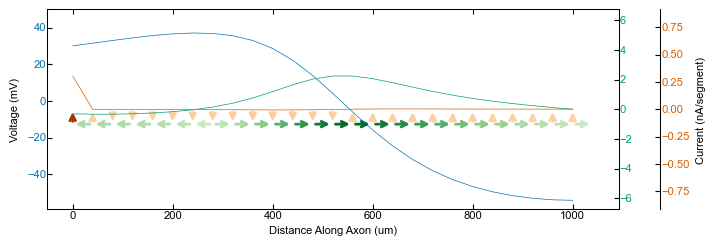

In [19]:
axon_length = 1000  # Axon length in um
soma_diameter = 20  # Spherical soma diameter in um
N = 25

synapse_idx, x, vmem, imem, x_iaxial, iaxial = ball_stick(axon_length, soma_diameter, 0)
#plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, soma_diameter/2/axon_length)
#plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25)
#plot_currents(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5)
#vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, soma_diameter/2/axon_length, N)
vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.25, N)
#vmem_neurons(synapse_idx, x, vmem, imem, x_iaxial, iaxial, 0.5, N)

# time_idx, space_idx = find_idx(synapse_idx, x, vmem, soma_diameter/2/axon_length)
# cylindrical_axon(x, vmem[:,time_idx])
# time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.25)
# cylindrical_axon(x, vmem[:,time_idx])
# time_idx, space_idx = find_idx(synapse_idx, x, vmem, 0.5)
# cylindrical_axon(x, vmem[:,time_idx])

In [18]:
def plot_current_vectors(x, vmem, imem, iaxial, N):
    N_down = int(len(x)/N)

    max_index = np.argmax(np.abs(imem))
    forward_indices = list(range(max_index + N_down, len(imem), N_down))
    print("Forward Indices:", forward_indices)
    backward_indices = list(range(max_index - N_down, -1, -N_down))
    print("Backward Indices:", backward_indices)
    downsampled_indices = [max_index]
    downsampled_indices.extend(forward_indices)
    downsampled_indices.extend(backward_indices)
    downsampled_indices = np.sort(downsampled_indices)
    print("Downsampled Indices:", downsampled_indices)

    u = iaxial[downsampled_indices]
    v = imem[downsampled_indices]
    phi = vmem[downsampled_indices]
    x_down = np.arange(len(u))
    
    u_alpha = 2/np.max(abs(u))
    v_alpha = 2/np.max(abs(v))
    
    #fig, ax1 = plt.subplots(figsize=(12, 4.5))
    fig = plt.figure(figsize=(8.8, 2.5))
    host = fig.add_axes([0.15, 0.1, 0.65, 0.8], axes_class=HostAxes)
    par1 = host.get_aux_axes(viewlim_mode=None, sharex=host)
    par2 = host.get_aux_axes(viewlim_mode=None, sharex=host)
    
    host.axis["right"].set_visible(False)

    par1.axis["right"].set_visible(True)
    par1.axis["right"].major_ticklabels.set_visible(True)
    par1.axis["right"].label.set_visible(True)

    par2.axis["right2"] = par2.new_fixed_axis(loc="right", offset=(30, 0))
    
    p1, = host.plot(downsampled_indices*seg_len, phi, color=my_purple, label='Membrane voltage')
    host.axis["left"].major_ticklabels.set_color(my_purple)
    
    p2, = par1.plot(downsampled_indices*seg_len, u, color=my_green, label='Longitudinal current')
    par1.axis["right"].major_ticklabels.set_color(my_green)
    p3, = par2.plot(downsampled_indices*seg_len, v, color=my_orange, label='Transverse current')
    par2.axis["right2"].major_ticklabels.set_color(my_orange)

    # Create a colormap and normalize object
    cmap_u = plt.get_cmap(my_green_cmap)
    cmap_v = plt.get_cmap(my_orange_cmap)
    u_norm = Normalize(min(abs(u)), max(abs(u)))
    v_norm = Normalize(min(abs(v)), max(abs(v)))

    step = downsampled_indices[1]
    for (xi, ui) in zip(x_down, u):
        if ui < 0:
            color = cmap_u(u_norm(-ui))
            arrow = FancyArrowPatch(
                (downsampled_indices[xi+1]*seg_len, -1), (downsampled_indices[xi]*seg_len, -1),
                #linewidth=-ui,
                #color='blue',
                linewidth=2,
                color=color,
                #transform=ax1.transAxes,
                arrowstyle='->',
                mutation_scale=10
                )
        else:
            color = cmap_u(u_norm(ui))
            arrow = FancyArrowPatch(
                (downsampled_indices[xi]*seg_len, -1), ((downsampled_indices[xi]+step)*seg_len, -1),
                #linewidth=ui,
                #color='blue',
                linewidth=2,
                color=color,
                #transform=ax1.transAxes,
                arrowstyle='->',
                mutation_scale=10
                )
        par1.axis.axes.add_patch(arrow)

    for (xi, vi) in zip(x_down, v):
        if vi < 0:
            color = cmap_v(v_norm(-vi))
            arrow = FancyArrowPatch(
                (downsampled_indices[xi]*seg_len, 0), (downsampled_indices[xi]*seg_len, -1),
                #linewidth=-vi,
                #color='green',
                linewidth=2,
                color=color,
                #transform=ax1.transAxes,
                arrowstyle='->',
                mutation_scale=10
                )
        else:
            color = cmap_v(v_norm(vi))
            arrow = FancyArrowPatch(
                (downsampled_indices[xi]*seg_len, -1), (downsampled_indices[xi]*seg_len, 0),
                #linewidth=vi,
                #color='green',
                linewidth=2,
                color=color,
                #transform=ax1.transAxes,
                arrowstyle='->',
                mutation_scale=10
                )
        par1.axis.axes.add_patch(arrow) 
        
    par1.axis.axes.set_aspect('equal', adjustable='box')
    
    host.set(xlabel="Distance Along Axon (um)", ylabel="Voltage (mV)")
    
    range_scale = 3
    long_range = (-np.max(np.abs(u))*range_scale, np.max(np.abs(u))*range_scale)
    trans_range = (-np.max(np.abs(v))*range_scale, np.max(np.abs(v))*range_scale)
    host.set(ylim=(-59, 50))
    par1.set(ylim=long_range, ylabel="")
    par2.set(ylim=trans_range, ylabel="Current (nA/segment)")
    plt.tight_layout(pad=0)
    
    plt.savefig("./testimage.svg",bbox_inches=0, transparent=True)
    
    #host.axis["left"].line.set_linewidth(0.5)
    
#     host.legend()

#     lines_1, labels_1 = ax1.get_legend_handles_labels()
#     lines_2, labels_2 = ax2.get_legend_handles_labels()
#     ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper right')

#     plt.title(f"longitudinal current scaled by {u_alpha:.2f}, "
#             f"transverse current scaled by {v_alpha:.2f}")
#     plt.show()

In [11]:
plt.rcParams['lines.linewidth'] = 0.5
font = {'monospace' : 'Arial',
        'family': 'monospace',
        'weight' : 'normal',
        'size'   : 8}
plt.rc('font', **font)
plt.rcParams['xtick.major.pad']='.5'
plt.rcParams['ytick.major.pad']='.5'
plt.rcParams['axes.labelpad']='-2'
plt.rcParams['axes.linewidth'] = 0.75 # set the value globally

In [47]:
np.shape(vmem)

(2002, 3201)

In [48]:
seg_len

0.5

In [49]:
downsampled_indices

NameError: name 'downsampled_indices' is not defined